# 1. Images as Data

When we look at an image, we see objects, colors, shapes, and meaning.

But a computer does not directly see a "cat", a "person", or a "building".

To a computer, an image is just a grid of numbers.

Each number represents the intensity of light at a particular location in the image.

For a grayscale image, each pixel has one value:

- `0` means black
- `255` means white
- values in between represent different shades of gray

For a color image, each pixel usually has three values:

- Red
- Green
- Blue

This is called an RGB image.

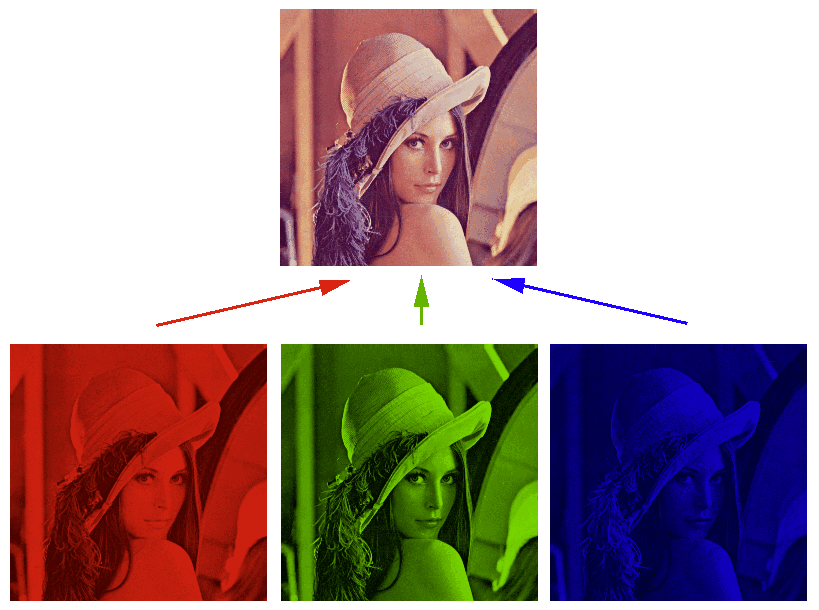


In this section, we will load an image and inspect what the computer actually sees.

In [1]:
import numpy as np
import matplotlib.pyplot as plt

from skimage import data
from skimage.color import rgb2gray

# Load a public sample image from scikit-image
image = data.astronaut()

print("Image type:", type(image))
print("Image shape:", image.shape)
print("Image dtype:", image.dtype)
print("Minimum pixel value:", image.min())
print("Maximum pixel value:", image.max())

Image type: <class 'numpy.ndarray'>
Image shape: (512, 512, 3)
Image dtype: uint8
Minimum pixel value: 0
Maximum pixel value: 255


The image has shape:

```python
(height, width, channels)
```

For this RGB image:

- height tells us how many pixel rows the image has
- width tells us how many pixel columns the image has
- channels = 3 means each pixel has Red, Green, and Blue values

**Note:** *uint8* is the data type of the image.

Now let's display the image.

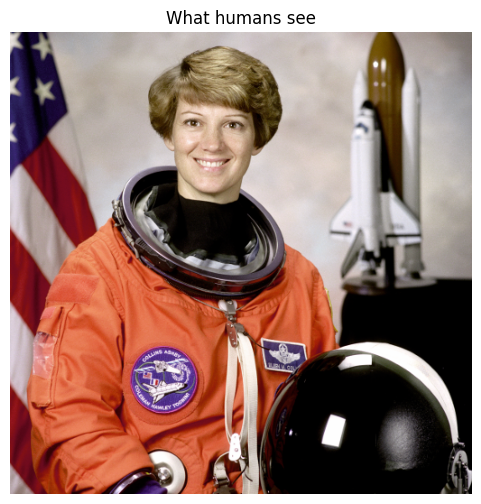

In [2]:
plt.figure(figsize=(6, 6))
plt.imshow(image)
plt.axis("off")
plt.title("What humans see")
plt.show()

Now let's inspect the actual numbers behind the image.

We will look at one pixel from the image.

A single RGB pixel contains three numbers:

```python
[R, G, B]
```

Each value is usually between 0 and 255.

In [3]:
row = 100
col = 150

pixel = image[row, col]

print(f"Pixel location: row={row}, col={col}")
print("RGB values:", pixel)
print("Red value:", pixel[0])
print("Green value:", pixel[1])
print("Blue value:", pixel[2])

Pixel location: row=100, col=150
RGB values: [193 182 178]
Red value: 193
Green value: 182
Blue value: 178


This means the pixel at that location is represented using three color intensity values.

The computer does not know this pixel is part of a face, helmet, background, or object.

It only sees numbers.

The meaning has to be learned from patterns in these numbers.

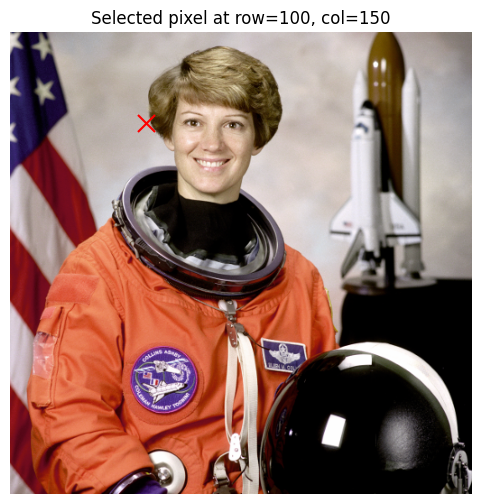

In [4]:
# Display the image and mark the selected pixel

plt.figure(figsize=(6, 6))
plt.imshow(image)
plt.scatter(col, row, s=150, marker="x", c="red")
plt.axis("off")
plt.title(f"Selected pixel at row={row}, col={col}")
plt.show()

# 2. Pixel Grid Explorer

Large real-world images contain thousands or millions of pixels.

To understand pixels more clearly, we will start with a tiny grayscale image.

A grayscale image has only one channel.

So instead of each pixel being:

```python
[R, G, B]
```

each pixel is just:

```python
brightness
```

The brightness value usually ranges from 0 to 255.

Let's create a tiny grayscale image manually

In [5]:
# Create a tiny grayscale image manually

tiny_image = np.array(
    [[0, 50, 100, 150], [25, 75, 125, 175], [50, 100, 150, 200], [75, 125, 200, 255]],
    dtype=np.uint8,
)

print(tiny_image)
print("Shape:", tiny_image.shape)
print("dtype:", tiny_image.dtype)


[[  0  50 100 150]
 [ 25  75 125 175]
 [ 50 100 150 200]
 [ 75 125 200 255]]
Shape: (4, 4)
dtype: uint8


Now let's visualize the image we just created.

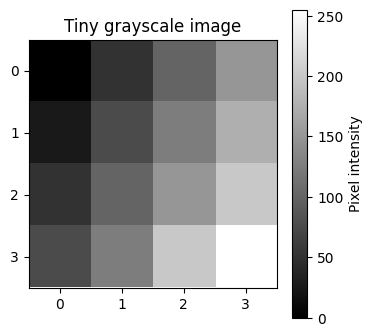

In [6]:
plt.figure(figsize=(4, 4))
plt.imshow(tiny_image, cmap="gray", vmin=0, vmax=255)
plt.colorbar(label="Pixel intensity")
plt.title("Tiny grayscale image")
plt.xticks(range(tiny_image.shape[1]))
plt.yticks(range(tiny_image.shape[0]))
plt.show()


Each square in the image corresponds to one number in the matrix.

Darker pixels have lower values.

Brighter pixels have higher values.

Now let's print the pixel values directly on top of the image.


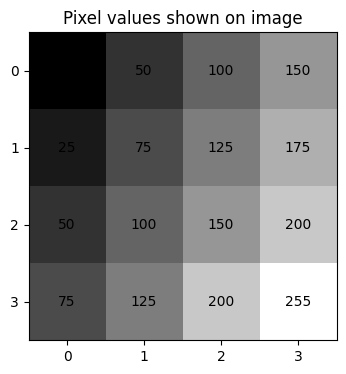

In [7]:
plt.figure(figsize=(4, 4))
plt.imshow(tiny_image, cmap="gray", vmin=0, vmax=255)

for row in range(tiny_image.shape[0]):
    for col in range(tiny_image.shape[1]):
        value = tiny_image[row, col]
        plt.text(col, row, str(value), ha="center", va="center")

plt.title("Pixel values shown on image")
plt.xticks(range(tiny_image.shape[1]))
plt.yticks(range(tiny_image.shape[0]))
plt.show()


Now let's make this interactive.

Use the slider to change a pixel's brightness value.

Observe how the number changes and how the image changes visually.


In [8]:
from ipywidgets import interact, IntSlider


def update_pixel(row, col, value):
    modified = tiny_image.copy()
    modified[row, col] = value

    plt.figure(figsize=(4, 4))
    plt.imshow(modified, cmap="gray", vmin=0, vmax=255)

    for r in range(modified.shape[0]):
        for c in range(modified.shape[1]):
            pixel_value = modified[r, c]
            plt.text(c, r, str(pixel_value), ha="center", va="center")

    plt.title(f"Pixel at row={row}, col={col} changed to {value}")
    plt.xticks(range(modified.shape[1]))
    plt.yticks(range(modified.shape[0]))
    plt.show()


interact(
    update_pixel,
    row=IntSlider(min=0, max=3, step=1, value=0),
    col=IntSlider(min=0, max=3, step=1, value=0),
    value=IntSlider(min=0, max=255, step=1, value=128),
)


interactive(children=(IntSlider(value=0, description='row', max=3), IntSlider(value=0, description='col', max=…

<function __main__.update_pixel(row, col, value)>

This is the **core idea**:

*An image is a matrix of numbers.*

Changing the numbers changes the image.

Machine learning models receive these numbers as input and learn patterns from them.

Now let's repeat the same idea with a real grayscale image.

We will load a public image from `scikit-image`, convert it to grayscale, and inspect a small region of pixels.


Image shape: (512, 512)
Image dtype: uint8
Minimum pixel value: 0
Maximum pixel value: 255


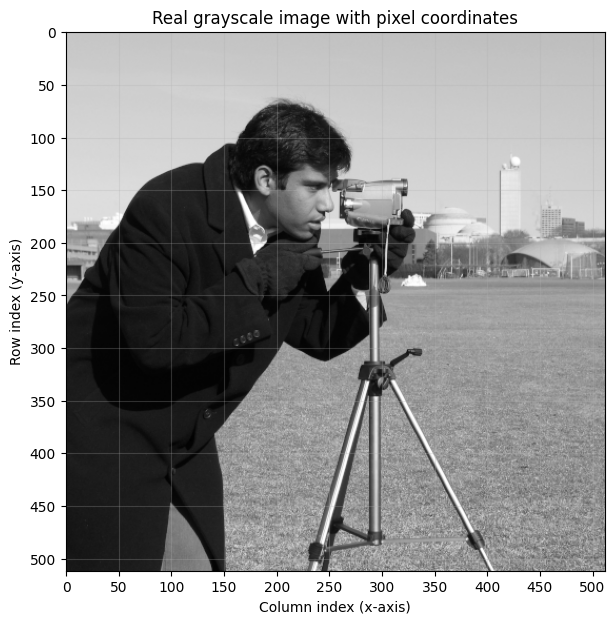

In [9]:
# Load another public sample image from scikit-image
camera_image = data.camera()

print("Image shape:", camera_image.shape)
print("Image dtype:", camera_image.dtype)
print("Minimum pixel value:", camera_image.min())
print("Maximum pixel value:", camera_image.max())

plt.figure(figsize=(7, 7))
plt.imshow(camera_image, cmap="gray", vmin=0, vmax=255)

plt.title("Real grayscale image with pixel coordinates")
plt.xlabel("Column index (x-axis)")
plt.ylabel("Row index (y-axis)")

plt.xticks(range(0, camera_image.shape[1], 50))
plt.yticks(range(0, camera_image.shape[0], 50))

plt.grid(alpha=0.25)
plt.show()


Let's zoom into a small region.

This makes it easier to see how a real image is still just a grid of numbers.


In [10]:
# Take a small crop from the image
crop = camera_image[175:200, 225:250]

print("Crop shape:", crop.shape)
print(crop)


Crop shape: (25, 25)
[[126 127 131 130 137 143 145 148 145 141 135 145 151 153 156 167 172 166
  138 140 117 156 218 218 217]
 [124 129 128 129 134 136 134 132 127 126 127 138 141 155 173 174 161 137
  121 140 141 171 218 218 218]
 [124 126 123 123 123 126 122 116 109 111 118 131 157 168 169 144 118 114
  116 120 124 215 223 224 224]
 [119 116 118 118 119 114 107  97  98 102 117 132 137 120  99  94 100 100
   98 118 206 230 230 230 230]
 [109 112 108 105 104  87  75  61  59  69  75  70  65  55  52  61  85 116
  158 213 230 229 231 232 231]
 [100  97  90  82  67  49  41  36  36  35  46  45  35  32  27  35 116 229
  228 228 230 229 230 230 230]
 [ 88  82  78  77  93 122 147 141 105  87  79  71  50  43  46  49  86 224
  232 232 232 233 233 234 233]
 [ 82  82  88  97 116 134 160 168 170 167 155 152 138 123 113 112 109 218
  240 240 240 240 240 241 241]
 [ 87  93 102 111 108 109 125 152 168 175 186 177 156 154 149 149 145 216
  240 241 241 240 241 241 241]
 [ 92  99 106 114 112 103 104 120 

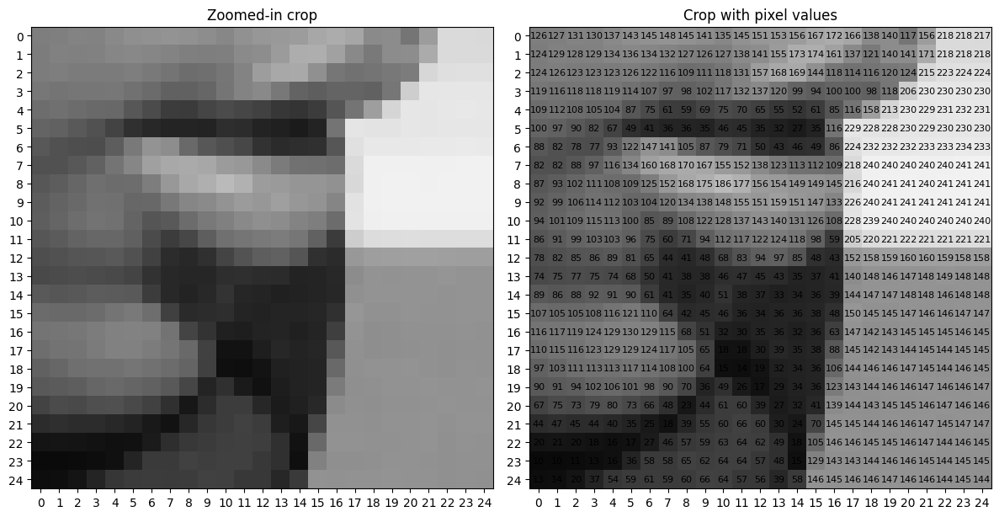

In [11]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Left: crop without annotations
axes[0].imshow(crop, cmap="gray", vmin=0, vmax=255)
axes[0].set_title("Zoomed-in crop")
axes[0].set_xticks(range(crop.shape[1]))
axes[0].set_yticks(range(crop.shape[0]))

# Right: crop with pixel value annotations
axes[1].imshow(crop, cmap="gray", vmin=0, vmax=255)
axes[1].set_title("Crop with pixel values")
axes[1].set_xticks(range(crop.shape[1]))
axes[1].set_yticks(range(crop.shape[0]))

for row in range(crop.shape[0]):
    for col in range(crop.shape[1]):
        value = crop[row, col]
        axes[1].text(col, row, str(value), ha="center", va="center", fontsize=8)

plt.tight_layout()
plt.show()


Even this real image is ultimately just numbers arranged in a grid.

The only difference between the tiny manual image and this real image is scale.

A real image has many more pixels.

But the representation idea is the same:

```python
image = matrix of pixel values
```

# 3. RGB Channel Breakdown

A color image is usually represented using three channels:

- **Red**
- **Green**
- **Blue**

This is called an **RGB image**.

Instead of each pixel having one brightness value, each pixel has three values:

```python
[R, G, B]
```

For example:

```python
[255, 0, 0]
```

means full red, no green, and no blue.

In this section, we will split a color image into its Red, Green, and Blue channels.

In [12]:
import numpy as np
import matplotlib.pyplot as plt

from skimage import data

# Load a public color image from scikit-image
image = data.astronaut()

print("Image shape:", image.shape)
print("Image dtype:", image.dtype)
print("Minimum pixel value:", image.min())
print("Maximum pixel value:", image.max())


Image shape: (512, 512, 3)
Image dtype: uint8
Minimum pixel value: 0
Maximum pixel value: 255


The shape of this image is:

```python
(height, width, channels)
```

Since this is an RGB image, the third dimension has size `3`.

That means every pixel contains three values.


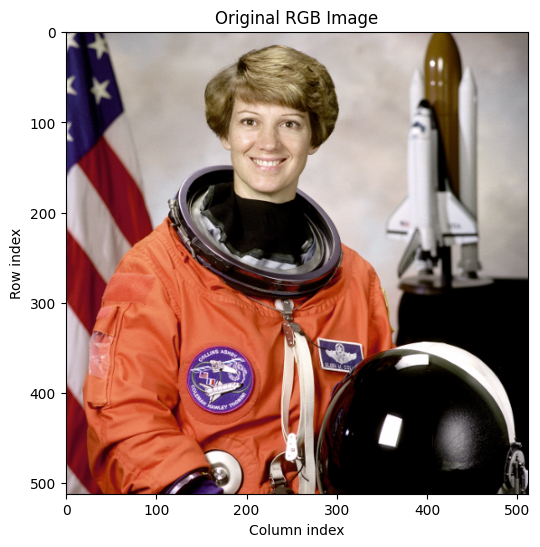

In [13]:
plt.figure(figsize=(6, 6))
plt.imshow(image)
plt.title("Original RGB Image")
plt.xlabel("Column index")
plt.ylabel("Row index")
plt.show()


Now let's separate the image into its three channels.

In NumPy, we can access channels like this:

```python
red_channel = image[:, :, 0]
green_channel = image[:, :, 1]
blue_channel = image[:, :, 2]
```

The first `:` means all rows.

The second `:` means all columns.

The final index selects the color channel:

- `0` for Red
- `1` for Green
- `2` for Blue


In [14]:
red_channel = image[:, :, 0]
green_channel = image[:, :, 1]
blue_channel = image[:, :, 2]

print("Red channel shape:", red_channel.shape)
print("Green channel shape:", green_channel.shape)
print("Blue channel shape:", blue_channel.shape)


Red channel shape: (512, 512)
Green channel shape: (512, 512)
Blue channel shape: (512, 512)


Each individual channel is a 2D matrix.

So the Red channel alone is a grayscale-like image showing how much red exists at each pixel location.

The same is true for Green and Blue.


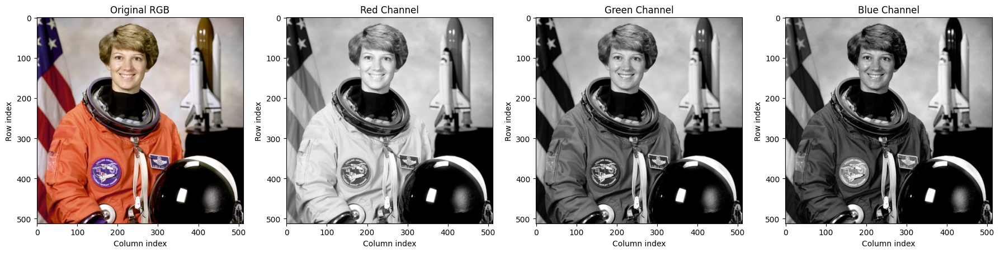

In [15]:
fig, axes = plt.subplots(1, 4, figsize=(18, 5))

axes[0].imshow(image)
axes[0].set_title("Original RGB")
axes[0].set_xlabel("Column index")
axes[0].set_ylabel("Row index")

axes[1].imshow(red_channel, cmap="gray", vmin=0, vmax=255)
axes[1].set_title("Red Channel")
axes[1].set_xlabel("Column index")
axes[1].set_ylabel("Row index")

axes[2].imshow(green_channel, cmap="gray", vmin=0, vmax=255)
axes[2].set_title("Green Channel")
axes[2].set_xlabel("Column index")
axes[2].set_ylabel("Row index")

axes[3].imshow(blue_channel, cmap="gray", vmin=0, vmax=255)
axes[3].set_title("Blue Channel")
axes[3].set_xlabel("Column index")
axes[3].set_ylabel("Row index")

plt.tight_layout()
plt.show()


The channel images are shown in grayscale because each channel is just a 2D matrix of intensity values.

A bright area in the Red channel means that region has high red intensity.

A dark area means that region has low red intensity.

Now let's reconstruct the image by combining the three channels again.


Reconstructed image shape: (512, 512, 3)


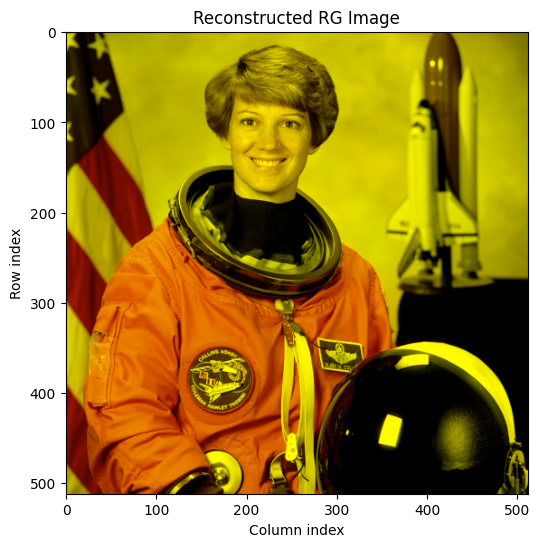

In [16]:
reconstructed_rg_image = np.stack([red_channel, green_channel, np.zeros_like(blue_channel)], axis=2)

print("Reconstructed image shape:", reconstructed_rg_image.shape)

plt.figure(figsize=(6, 6))
plt.imshow(reconstructed_rg_image)
plt.title("Reconstructed RG Image")
plt.xlabel("Column index")
plt.ylabel("Row index")
plt.show()

Reconstructed image shape: (512, 512, 3)


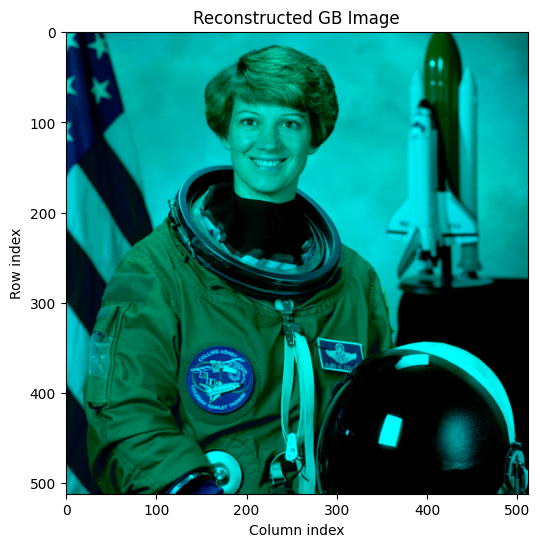

In [17]:
reconstructed_gb_image = np.stack([np.zeros_like(red_channel), green_channel, blue_channel], axis=2)

print("Reconstructed image shape:", reconstructed_gb_image.shape)

plt.figure(figsize=(6, 6))
plt.imshow(reconstructed_gb_image)
plt.title("Reconstructed GB Image")
plt.xlabel("Column index")
plt.ylabel("Row index")
plt.show()

Reconstructed image shape: (512, 512, 3)


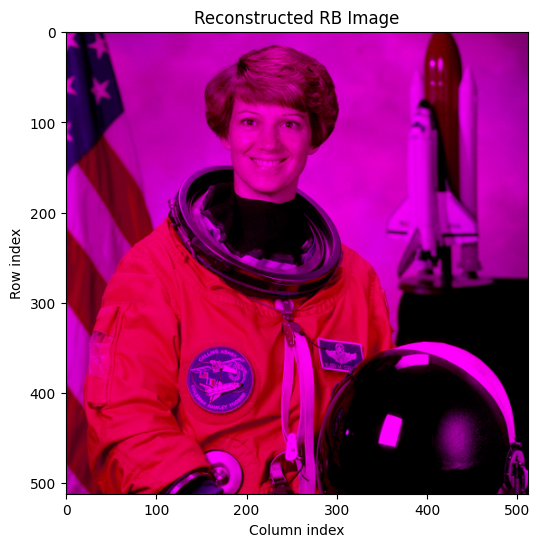

In [18]:
reconstructed_rb_image = np.stack([red_channel, np.zeros_like(green_channel), blue_channel], axis=2)

print("Reconstructed image shape:", reconstructed_rb_image.shape)

plt.figure(figsize=(6, 6))
plt.imshow(reconstructed_rb_image)
plt.title("Reconstructed RB Image")
plt.xlabel("Column index")
plt.ylabel("Row index")
plt.show()

Reconstructed image shape: (512, 512, 3)


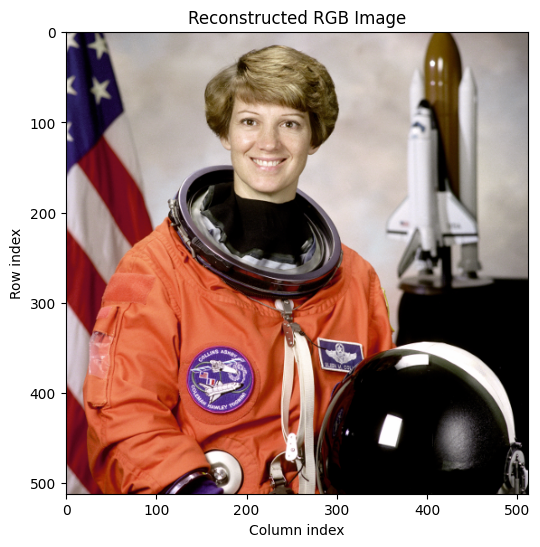

In [19]:
reconstructed_image = np.stack([red_channel, green_channel, blue_channel], axis=2)

print("Reconstructed image shape:", reconstructed_image.shape)

plt.figure(figsize=(6, 6))
plt.imshow(reconstructed_image)
plt.title("Reconstructed RGB Image")
plt.xlabel("Column index")
plt.ylabel("Row index")
plt.show()

The reconstructed image looks the same as the original image because we combined the same Red, Green, and Blue channels back together.

Now let's make this interactive.

We will use checkboxes to turn each channel on or off.

In [20]:
from ipywidgets import interact, Checkbox


def show_rgb_channels(show_red=True, show_green=True, show_blue=True):
    modified = image.copy()

    if not show_red:
        modified[:, :, 0] = 0

    if not show_green:
        modified[:, :, 1] = 0

    if not show_blue:
        modified[:, :, 2] = 0

    plt.figure(figsize=(6, 6))
    plt.imshow(modified)
    plt.title(f"Red: {show_red}, Green: {show_green}, Blue: {show_blue}")
    plt.xlabel("Column index")
    plt.ylabel("Row index")
    plt.show()


interact(
    show_rgb_channels,
    show_red=Checkbox(value=True, description="Red"),
    show_green=Checkbox(value=True, description="Green"),
    show_blue=Checkbox(value=True, description="Blue"),
)


interactive(children=(Checkbox(value=True, description='Red'), Checkbox(value=True, description='Green'), Chec…

<function __main__.show_rgb_channels(show_red=True, show_green=True, show_blue=True)>

Turning channels on and off changes the colors of the image.

This helps us understand an important idea:

A color image is not stored as one single object.

It is stored as multiple numerical grids stacked together.


We can also control the strength of each channel.

Instead of turning a channel completely on or off, we can multiply it by a value between `0.0` and `1.0`.


In [21]:
from ipywidgets import FloatSlider


def adjust_rgb_strength(red_strength=1.0, green_strength=1.0, blue_strength=1.0):
    modified = image.astype(np.float32).copy()

    modified[:, :, 0] *= red_strength
    modified[:, :, 1] *= green_strength
    modified[:, :, 2] *= blue_strength

    modified = np.clip(modified, 0, 255).astype(np.uint8)

    plt.figure(figsize=(6, 6))
    plt.imshow(modified)
    plt.title("RGB Channel Strength Adjustment")
    plt.xlabel("Column index")
    plt.ylabel("Row index")
    plt.show()


interact(
    adjust_rgb_strength,
    red_strength=FloatSlider(min=0.0, max=1.0, step=0.05, value=1.0, description="Red"),
    green_strength=FloatSlider(
        min=0.0, max=1.0, step=0.05, value=1.0, description="Green"
    ),
    blue_strength=FloatSlider(
        min=0.0, max=1.0, step=0.05, value=1.0, description="Blue"
    ),
)


interactive(children=(FloatSlider(value=1.0, description='Red', max=1.0, step=0.05), FloatSlider(value=1.0, de…

<function __main__.adjust_rgb_strength(red_strength=1.0, green_strength=1.0, blue_strength=1.0)>

# 4. Image Shape & Tensor View

In computer vision, we usually represent images as tensors.

A tensor is a general name for numerical data arranged in dimensions.

For images, the most common shape is:

```python
height × width × channels
```

For example:

```python
512 × 512 × 3
```

means:

- 512 rows of pixels
- 512 columns of pixels
- 3 color channels: Red, Green, and Blue

Let's inspect the shape of our image more carefully.

In [22]:
height, width, channels = image.shape

print("Height:", height)
print("Width:", width)
print("Channels:", channels)
print("Full image shape:", image.shape)

Height: 512
Width: 512
Channels: 3
Full image shape: (512, 512, 3)


The shape tells us how the image is stored in memory.

When we write:

```python
image[row, col]
```

we get one pixel.

When we write:

```python
image[row, col, channel]
```

we get one specific channel value from one pixel.

In [23]:
row = 100
col = 150

pixel = image[row, col]

print(f"Pixel at row={row}, col={col}:")
print(pixel)

print("Red value:", image[row, col, 0])
print("Green value:", image[row, col, 1])
print("Blue value:", image[row, col, 2])


Pixel at row=100, col=150:
[193 182 178]
Red value: 193
Green value: 182
Blue value: 178


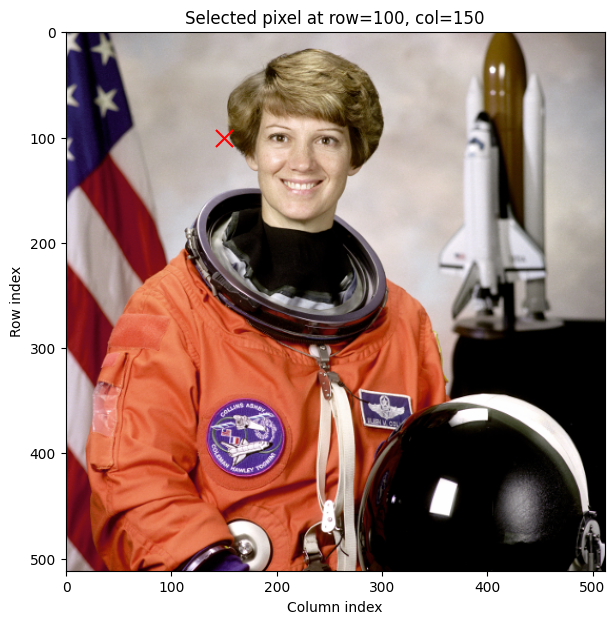

In [24]:
plt.figure(figsize=(7, 7))
plt.imshow(image)
plt.scatter(col, row, s=150, marker="x", c="red")
plt.title(f"Selected pixel at row={row}, col={col}")
plt.xlabel("Column index")
plt.ylabel("Row index")
plt.show()


## Image Cropping

Now let's crop the image.

Cropping means selecting a smaller region from the image tensor.

For example:

```python
image[50:250, 100:300]
```

means:

- take rows from `50` to `249`
- take columns from `100` to `299`
- keep all color channels


Original image shape: (512, 512, 3)
Crop shape: (200, 200, 3)


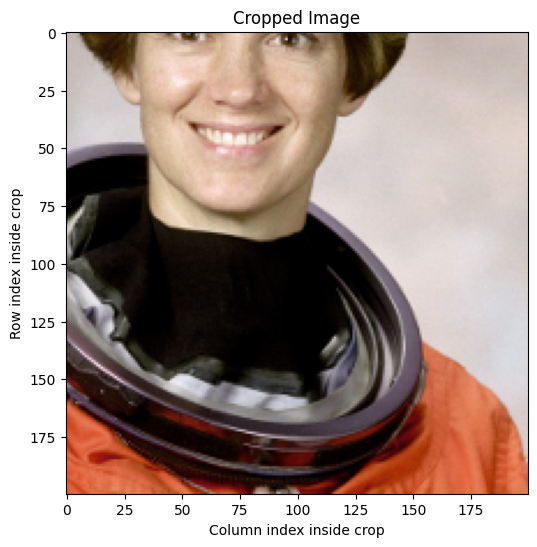

In [27]:
crop = image[50+50:250+50, 100+50:300+50]

print("Original image shape:", image.shape)
print("Crop shape:", crop.shape)

plt.figure(figsize=(6, 6))
plt.imshow(crop)
plt.title("Cropped Image")
plt.xlabel("Column index inside crop")
plt.ylabel("Row index inside crop")
plt.show()


Now let's make cropping interactive.

You can change the starting row, starting column, crop height, and crop width.

As the crop changes, observe how the tensor shape changes too.


In [28]:
from ipywidgets import IntSlider


def interactive_crop(start_row=50, start_col=100, crop_height=200, crop_width=200):
    end_row = min(start_row + crop_height, image.shape[0])
    end_col = min(start_col + crop_width, image.shape[1])

    cropped = image[start_row:end_row, start_col:end_col]

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    axes[0].imshow(image)
    axes[0].set_title(f"Original Image\nShape: {image.shape}")
    axes[0].set_xlabel("Column index")
    axes[0].set_ylabel("Row index")

    rect_x = [start_col, end_col, end_col, start_col, start_col]
    rect_y = [start_row, start_row, end_row, end_row, start_row]
    axes[0].plot(rect_x, rect_y, linewidth=2)

    axes[1].imshow(cropped)
    axes[1].set_title(f"Cropped Image\nShape: {cropped.shape}")
    axes[1].set_xlabel("Column index inside crop")
    axes[1].set_ylabel("Row index inside crop")

    plt.tight_layout()
    plt.show()


interact(
    interactive_crop,
    start_row=IntSlider(
        min=0, max=image.shape[0] - 1, step=10, value=50, description="Start row"
    ),
    start_col=IntSlider(
        min=0, max=image.shape[1] - 1, step=10, value=100, description="Start col"
    ),
    crop_height=IntSlider(
        min=20, max=image.shape[0], step=10, value=200, description="Height"
    ),
    crop_width=IntSlider(
        min=20, max=image.shape[1], step=10, value=200, description="Width"
    ),
)


interactive(children=(IntSlider(value=50, description='Start row', max=511, step=10), IntSlider(value=100, des…

<function __main__.interactive_crop(start_row=50, start_col=100, crop_height=200, crop_width=200)>

## Resizing Images

Next, let's resize the image.

Resizing changes the height and width of the image.

This is common in computer vision because models usually expect a fixed input size.

For example, many models expect images shaped like:

```python
224 × 224 × 3
```


Original image shape: (512, 512, 3)
Resized image shape: (24, 24, 3)


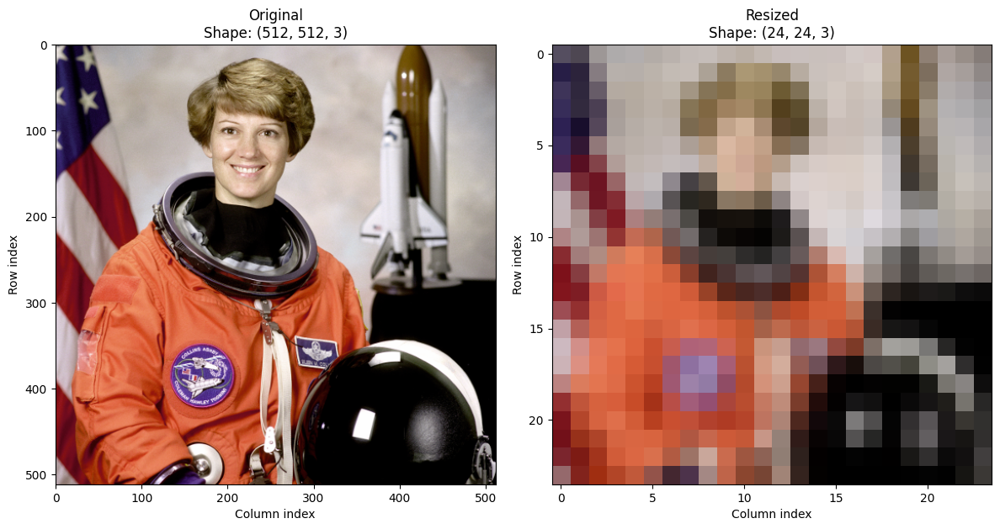

In [31]:
from skimage.transform import resize

resized_image = resize(
    image, output_shape=(24, 24), preserve_range=True, anti_aliasing=True
).astype(np.uint8)

print("Original image shape:", image.shape)
print("Resized image shape:", resized_image.shape)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(image)
axes[0].set_title(f"Original\nShape: {image.shape}")
axes[0].set_xlabel("Column index")
axes[0].set_ylabel("Row index")

axes[1].imshow(resized_image)
axes[1].set_title(f"Resized\nShape: {resized_image.shape}")
axes[1].set_xlabel("Column index")
axes[1].set_ylabel("Row index")

plt.tight_layout()
plt.show()


The resized image still has 3 channels.

Only the height and width changed.

Now let's make resizing interactive.


In [30]:
def interactive_resize(new_height=224, new_width=224):
    resized = resize(
        image,
        output_shape=(new_height, new_width),
        preserve_range=True,
        anti_aliasing=True,
    ).astype(np.uint8)

    plt.figure(figsize=(6, 6))
    plt.imshow(resized)
    plt.title(f"Resized Image\nShape: {resized.shape}")
    plt.xlabel("Column index")
    plt.ylabel("Row index")
    plt.show()


interact(
    interactive_resize,
    new_height=IntSlider(min=50, max=512, step=10, value=224, description="Height"),
    new_width=IntSlider(min=50, max=512, step=10, value=224, description="Width"),
)


interactive(children=(IntSlider(value=224, description='Height', max=512, min=50, step=10), IntSlider(value=22…

<function __main__.interactive_resize(new_height=224, new_width=224)>

The key lesson:

Images are *tensors*.

Changing the image usually means changing the tensor.

- Cropping changes the selected region.
- Resizing changes height and width.
- RGB images keep 3 channels.
- Grayscale images usually have 1 channel or no explicit channel dimension.

Computer vision models do not receive images as meaning.

They receive tensors of numbers.




## Formal Definition: Tensor

A **tensor** is a mathematical object that generalizes scalars, vectors, and matrices to any number of dimensions.

In machine learning, we usually use the word **tensor** in a practical sense:

> A tensor is a multi-dimensional array with a fixed data type and a defined shape.

Examples:

| Object | Tensor Rank / Dimensions | Example Shape |
|---|---:|---|
| Scalar | 0D | `()` |
| Vector | 1D | `(5,)` |
| Matrix | 2D | `(3, 4)` |
| Grayscale image | 2D | `(height, width)` |
| RGB image | 3D | `(height, width, channels)` |
| Batch of RGB images | 4D | `(batch_size, height, width, channels)` |

So when we say an image is a tensor, we mean it is numerical data arranged across dimensions.

For an RGB image:

```python
image.shape == (height, width, 3)
```

Each location in the tensor stores the Red, Green, and Blue intensity values for one pixel.

In deeper mathematics, a tensor is more than just a multi-dimensional array: it is an object that can represent multilinear relationships between vector spaces. But for computer vision and deep learning, thinking of tensors as structured multi-dimensional arrays is the right starting point.


# 5. Manual Feature Extraction

So far, we have learned that images are tensors of pixel values.

But raw pixel values are not always the most useful representation.

Sometimes, we apply operations to an image to highlight useful information.

For example:

- **Blur** smooths the image and reduces noise.
- **Sharpening** makes edges and details more prominent.
- **Edge detection** highlights boundaries between objects or regions.

Before deep learning became dominant, many computer vision systems relied heavily on manually designed feature extraction techniques.

Even today, these operations are useful for building intuition.

They also help us understand why Convolutional Neural Networks use filters/kernels.

In [32]:
import numpy as np
import matplotlib.pyplot as plt

from skimage import data
from skimage.util import img_as_ubyte


We will use a public grayscale image from `scikit-image`.

A grayscale image is easier to work with here because each pixel has only one intensity value.


Image shape: (512, 512)
Image dtype: uint8
Minimum pixel value: 0
Maximum pixel value: 255


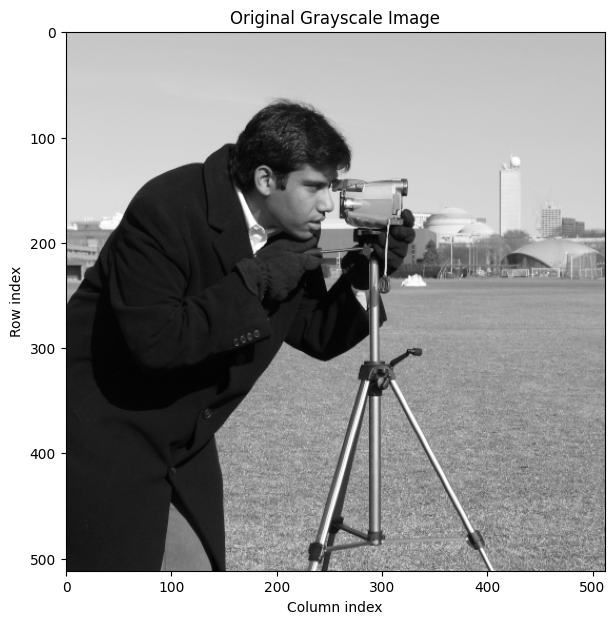

In [33]:
# Load a public grayscale image
image = data.camera()

print("Image shape:", image.shape)
print("Image dtype:", image.dtype)
print("Minimum pixel value:", image.min())
print("Maximum pixel value:", image.max())

plt.figure(figsize=(7, 7))
plt.imshow(image, cmap="gray", vmin=0, vmax=255)
plt.title("Original Grayscale Image")
plt.xlabel("Column index")
plt.ylabel("Row index")
plt.show()


## 5.1 Blur

A blur operation smooths the image.

It reduces sharp changes between neighboring pixels.

This can help reduce noise, but it also removes some fine details.

One common blur technique is **Gaussian blur**.


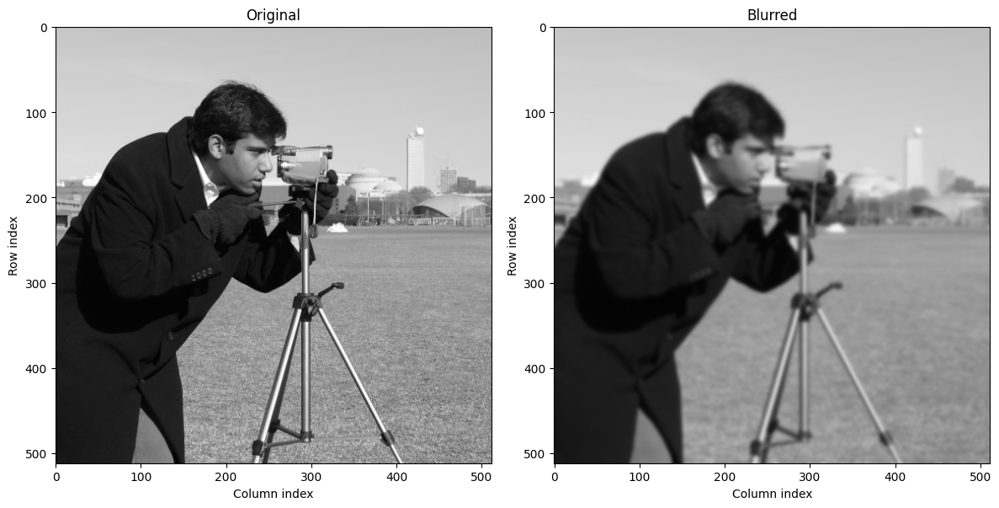

In [34]:
from skimage.filters import gaussian

blurred_image = gaussian(image, sigma=2, preserve_range=True).astype(np.uint8)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(image, cmap="gray", vmin=0, vmax=255)
axes[0].set_title("Original")
axes[0].set_xlabel("Column index")
axes[0].set_ylabel("Row index")

axes[1].imshow(blurred_image, cmap="gray", vmin=0, vmax=255)
axes[1].set_title("Blurred")
axes[1].set_xlabel("Column index")
axes[1].set_ylabel("Row index")

plt.tight_layout()
plt.show()


A blur filter works by replacing each pixel with a weighted average of nearby pixels.

So each output pixel depends on a small local neighborhood around it.

This idea of looking at small local regions is also central to CNNs.


## 5.2 Sharpening

Sharpening does the opposite of blurring.

It increases the difference between neighboring pixels.

This makes edges and details appear stronger.

We can sharpen an image using a small matrix called a **kernel**.


In [35]:
sharpen_kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

print("Sharpening kernel:")
print(sharpen_kernel)


Sharpening kernel:
[[ 0 -1  0]
 [-1  5 -1]
 [ 0 -1  0]]


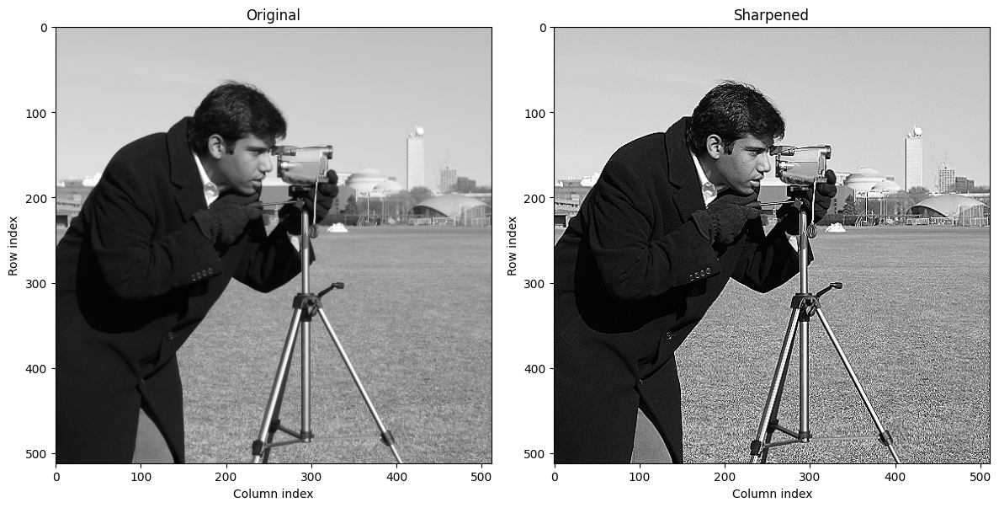

In [36]:
from scipy.ndimage import convolve

sharpened_image = convolve(image.astype(np.float32), sharpen_kernel)

sharpened_image = np.clip(sharpened_image, 0, 255).astype(np.uint8)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(image, cmap="gray", vmin=0, vmax=255)
axes[0].set_title("Original")
axes[0].set_xlabel("Column index")
axes[0].set_ylabel("Row index")

axes[1].imshow(sharpened_image, cmap="gray", vmin=0, vmax=255)
axes[1].set_title("Sharpened")
axes[1].set_xlabel("Column index")
axes[1].set_ylabel("Row index")

plt.tight_layout()
plt.show()


Notice that the sharpened image has stronger local details.

The kernel decides how neighboring pixels are combined.

In traditional image processing, humans manually design these kernels.

In CNNs, the model learns useful kernels from data.


## 5.3 Edge Detection

Edges are places where pixel intensity changes sharply.

For example, the boundary between a face and the background may create an edge.

Edge detection tries to highlight these sharp changes.

We will use the Sobel filter to detect edges.

Edges shape: (512, 512)
Minimum edge value: 0.0
Maximum edge value: 0.6447887988758096


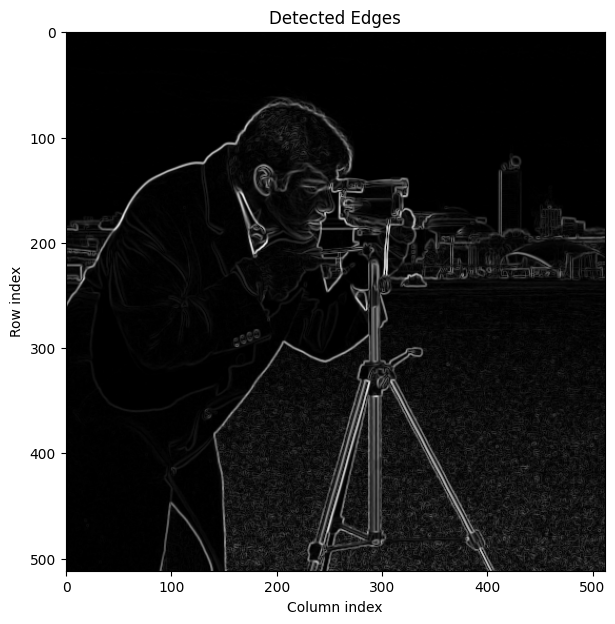

In [38]:
from skimage.filters import sobel

edges = sobel(image)

print("Edges shape:", edges.shape)
print("Minimum edge value:", edges.min())
print("Maximum edge value:", edges.max())

plt.figure(figsize=(7, 7))
plt.imshow(edges, cmap="gray")
plt.title("Detected Edges")
plt.xlabel("Column index")
plt.ylabel("Row index")
plt.show()


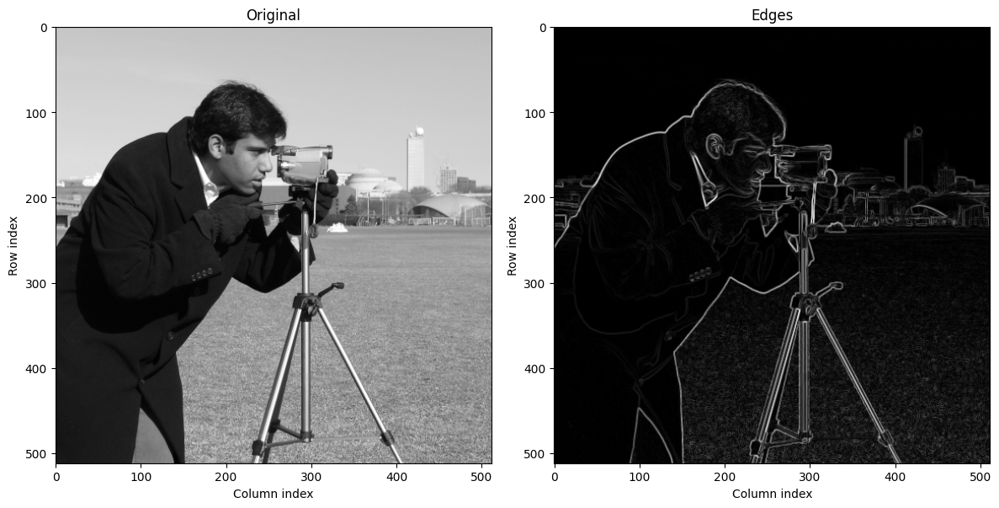

In [39]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(image, cmap="gray", vmin=0, vmax=255)
axes[0].set_title("Original")
axes[0].set_xlabel("Column index")
axes[0].set_ylabel("Row index")

axes[1].imshow(edges, cmap="gray")
axes[1].set_title("Edges")
axes[1].set_xlabel("Column index")
axes[1].set_ylabel("Row index")

plt.tight_layout()
plt.show()


The edge image is no longer trying to show the original scene.

Instead, it highlights structure.

This is an important idea:

Different filters can extract different kinds of information from the same image.


## 5.4 Connecting Filters to CNNs

A filter/kernel is a small matrix that slides over an image.

At each location, it combines nearby pixel values to produce a new value.

This creates a new image-like output called a **feature map**.

Traditional computer vision:

```python
human designs the filter
```

Convolutional Neural Networks:

```python
model learns the filters from data
```

So CNNs are powerful because they learn which filters are useful for the task.

For example:

- early layers may learn edges and textures
- middle layers may learn shapes and parts
- deeper layers may learn object-level patterns

This is why understanding manual filters is a good stepping stone toward understanding CNNs.


# 6. Flattening an Image

Many basic machine learning models expect the input to be a 1D vector.

For example:

- Linear Regression
- Logistic Regression
- Basic fully connected neural networks

But an image is naturally 2D or 3D.

A grayscale image has shape:

```python
height × width
```

An RGB image has shape:

```python
height × width × channels
```

To feed an image into a simple linear model, we often flatten it into one long vector.


In [1]:
import numpy as np
import matplotlib.pyplot as plt

from skimage import data
from skimage.transform import resize


In [2]:
image = data.camera()

# Take a small 8x8 crop from the image
small_image = image[100:108, 100:108]

print("Small image shape:", small_image.shape)
print(small_image)


Small image shape: (8, 8)
[[212 212 212 213 212 212 212 211]
 [213 212 212 211 213 212 213 211]
 [213 213 213 211 212 212 212 211]
 [213 213 212 212 212 213 213 212]
 [213 212 213 212 213 213 212 211]
 [213 213 213 211 212 213 212 212]
 [213 212 212 212 212 212 212 212]
 [212 213 213 212 213 213 213 212]]


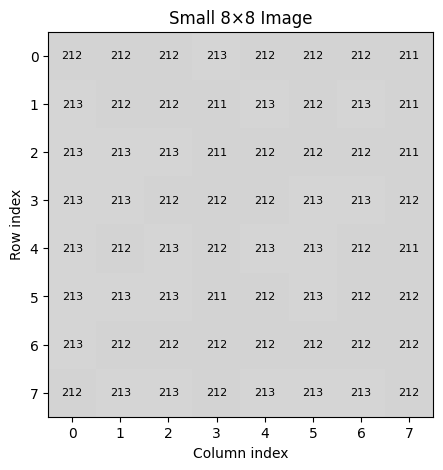

In [3]:
plt.figure(figsize=(5, 5))
plt.imshow(small_image, cmap="gray", vmin=0, vmax=255)

for row in range(small_image.shape[0]):
    for col in range(small_image.shape[1]):
        value = small_image[row, col]
        plt.text(col, row, str(value), ha="center", va="center", fontsize=8)

plt.title("Small 8×8 Image")
plt.xlabel("Column index")
plt.ylabel("Row index")
plt.xticks(range(small_image.shape[1]))
plt.yticks(range(small_image.shape[0]))
plt.show()


This image has shape:

```python
8 × 8
```

That means it contains:

```python
64 pixels
```

Now we will flatten it.

Flattening converts the 2D grid into a 1D vector.


In [4]:
flattened_image = small_image.flatten()

print("Original shape:", small_image.shape)
print("Flattened shape:", flattened_image.shape)
print(flattened_image)


Original shape: (8, 8)
Flattened shape: (64,)
[212 212 212 213 212 212 212 211 213 212 212 211 213 212 213 211 213 213
 213 211 212 212 212 211 213 213 212 212 212 213 213 212 213 212 213 212
 213 213 212 211 213 213 213 211 212 213 212 212 213 212 212 212 212 212
 212 212 212 213 213 212 213 213 213 212]


The image is now a single vector of length `64`.

The model can receive this vector as input.

But there is a cost:

The spatial layout becomes **less obvious**.

In the original image, each pixel had neighbors above, below, left, and right.

After flattening, the image becomes one long sequence of numbers.

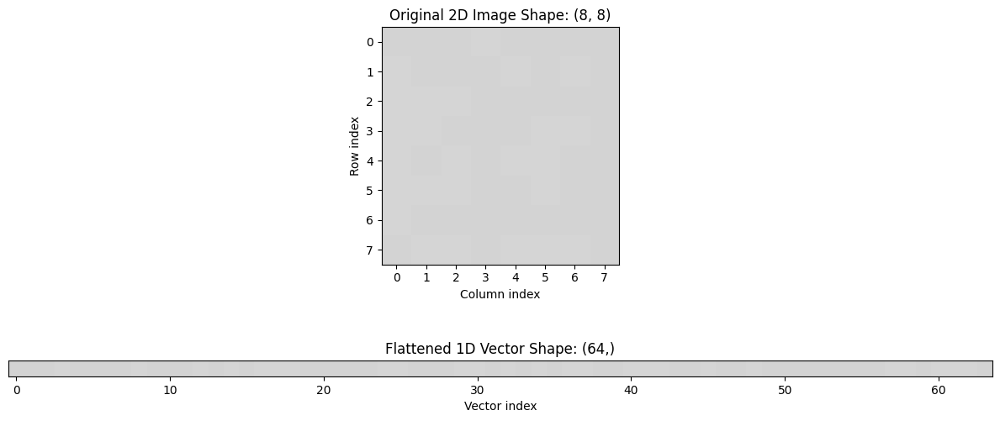

In [5]:
fig, axes = plt.subplots(2, 1, figsize=(12, 6))

axes[0].imshow(small_image, cmap="gray", vmin=0, vmax=255)
axes[0].set_title(f"Original 2D Image Shape: {small_image.shape}")
axes[0].set_xlabel("Column index")
axes[0].set_ylabel("Row index")
axes[0].set_xticks(range(small_image.shape[1]))
axes[0].set_yticks(range(small_image.shape[0]))

axes[1].imshow(flattened_image.reshape(1, -1), cmap="gray", vmin=0, vmax=255)
axes[1].set_title(f"Flattened 1D Vector Shape: {flattened_image.shape}")
axes[1].set_xlabel("Vector index")
axes[1].set_yticks([])

plt.tight_layout()
plt.show()

In the 2D image, nearby pixels usually have related meaning.

For example, neighboring pixels may belong to the same edge, texture, or object part.

But after flattening, the model receives the image like this:

```python
[pixel_0, pixel_1, pixel_2, pixel_3, ...]
```

The model is not directly told which pixels were above, below, left, or right of each other.


## 6.1 Flattening a Larger Image

Now let's resize the image to a common deep learning input size.

We will use:

```python
64 × 64
```

Then we will flatten it.


In [6]:
resized_image = resize(
    image, output_shape=(64, 64), preserve_range=True, anti_aliasing=True
).astype(np.uint8)

flattened_resized_image = resized_image.flatten()

print("Resized image shape:", resized_image.shape)
print("Flattened vector shape:", flattened_resized_image.shape)
print("Number of input features:", len(flattened_resized_image))


Resized image shape: (64, 64)
Flattened vector shape: (4096,)
Number of input features: 4096


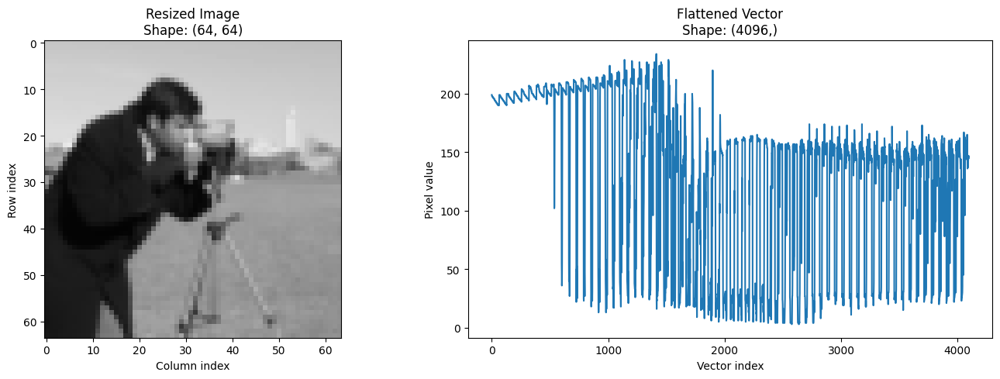

In [7]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].imshow(resized_image, cmap="gray", vmin=0, vmax=255)
axes[0].set_title(f"Resized Image\nShape: {resized_image.shape}")
axes[0].set_xlabel("Column index")
axes[0].set_ylabel("Row index")

axes[1].plot(flattened_resized_image)
axes[1].set_title(f"Flattened Vector\nShape: {flattened_resized_image.shape}")
axes[1].set_xlabel("Vector index")
axes[1].set_ylabel("Pixel value")

plt.tight_layout()
plt.show()


The `64 × 64` image becomes a vector with:

```python
4096 values
```

If this were an RGB image, the shape would be:

```python
64 × 64 × 3
```

After flattening, it would become:

```python
12288 values
```

So images can quickly become very high-dimensional inputs.


## 6.2 Why Flattening Can Be Limiting

Flattening is simple, and it allows us to use basic machine learning models.

But it has important limitations.

When we flatten an image:

- the 2D structure becomes harder for the model to use
- local neighborhoods are not directly represented
- nearby pixels in the image may become far apart in the vector
- the model must learn spatial relationships from scratch

This is one reason CNNs became so important for computer vision.

**CNNs process images while preserving their spatial structure.**

Instead of immediately turning the image into one long vector, CNNs use filters over local regions.

That allows them to learn patterns like:

- edges
- corners
- textures
- shapes
- object parts

So flattening helps us understand the basic input format, but CNNs are usually a better fit for image data.


# 7. Model Progression Demo

Now that we understand images as tensors, let's look at how different model types consume image data.

We will use the same image input and conceptually pass it through four model styles:

1. **Linear model**
2. **Dense neural network**
3. **Convolutional Neural Network**
4. **Vision Transformer**

The goal here is not to train these models.

The goal is to understand how each model sees the image differently.


In [8]:
import numpy as np
import matplotlib.pyplot as plt

from skimage import data
from skimage.transform import resize
from skimage.color import gray2rgb


We will use a public grayscale image from `scikit-image`.

To keep things simple, we will resize it to `64 × 64`.

This makes the image small enough to inspect, but still large enough to contain visible structure.


Original image shape: (512, 512)
Resized image shape: (64, 64)


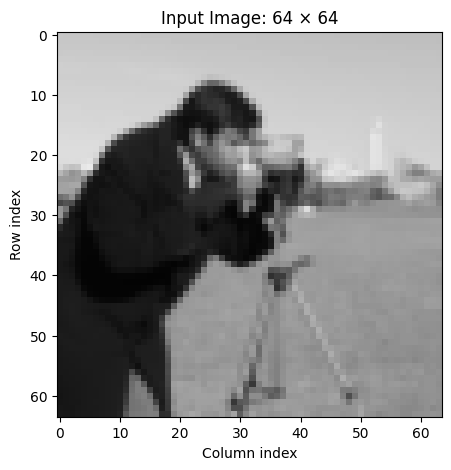

In [9]:
# Load a public grayscale image
image = data.camera()

# Resize image for this demo
image_64 = resize(
    image, output_shape=(64, 64), preserve_range=True, anti_aliasing=True
).astype(np.uint8)

print("Original image shape:", image.shape)
print("Resized image shape:", image_64.shape)

plt.figure(figsize=(5, 5))
plt.imshow(image_64, cmap="gray", vmin=0, vmax=255)
plt.title("Input Image: 64 × 64")
plt.xlabel("Column index")
plt.ylabel("Row index")
plt.show()


## 7.1 Linear Model

A linear model expects a simple 1D vector as input.

So before giving the image to the model, we flatten it.

The image starts as:

```python
64 × 64
```

After flattening, it becomes:

```python
4096
```

The model receives one long list of pixel values.

This is simple, but it loses the natural 2D structure of the image.


In [10]:
linear_input = image_64.flatten()

print("Image shape:", image_64.shape)
print("Linear model input shape:", linear_input.shape)
print("Number of input features:", linear_input.shape[0])

Image shape: (64, 64)
Linear model input shape: (4096,)
Number of input features: 4096


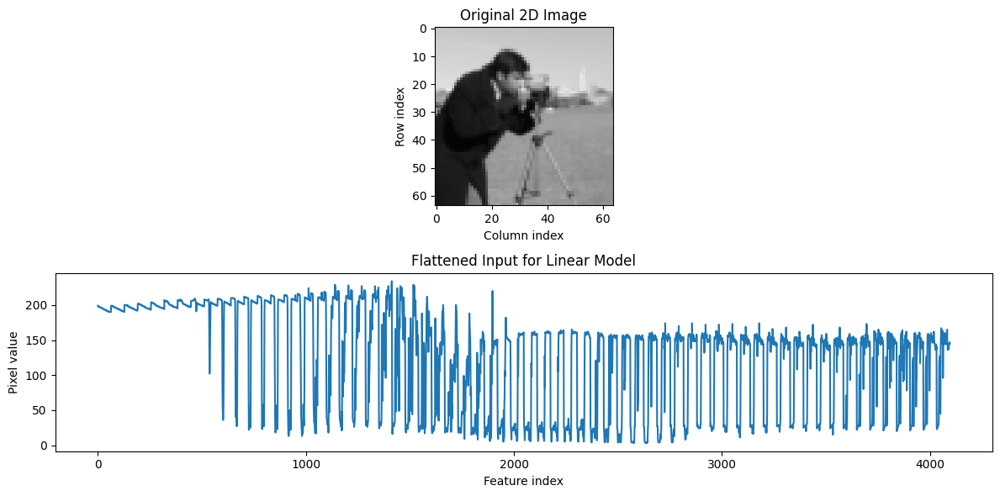

In [11]:
fig, axes = plt.subplots(2, 1, figsize=(12, 6))

axes[0].imshow(image_64, cmap="gray", vmin=0, vmax=255)
axes[0].set_title("Original 2D Image")
axes[0].set_xlabel("Column index")
axes[0].set_ylabel("Row index")

axes[1].plot(linear_input)
axes[1].set_title("Flattened Input for Linear Model")
axes[1].set_xlabel("Feature index")
axes[1].set_ylabel("Pixel value")

plt.tight_layout()
plt.show()


A linear model treats every pixel as a separate input feature.

Conceptually, it does something like this:

```python
output = w1*x1 + w2*x2 + w3*x3 + ... + bias
```

Each pixel gets its own weight.

But the model does not naturally know that pixel `120` was near pixel `121`, or that two pixels were part of the same local region.

It only sees a flat vector.

## 7.2 Dense Neural Network

A dense neural network, also called a fully connected neural network, usually also starts with a flattened image.

But instead of going directly from pixels to output, it passes the vector through hidden layers.

These hidden layers can learn more complex patterns than a linear model.

However, the input is still flattened first.

So the model still has to learn spatial relationships from scratch.


In [12]:
dense_input = image_64.flatten()

# Conceptual hidden layer sizes
input_size = dense_input.shape[0]
hidden_layer_1 = 512
hidden_layer_2 = 128
output_classes = 10

print("Dense neural network conceptual shapes:")
print(f"Input vector:        {input_size}")
print(f"Hidden layer 1:      {hidden_layer_1}")
print(f"Hidden layer 2:      {hidden_layer_2}")
print(f"Output classes:      {output_classes}")


Dense neural network conceptual shapes:
Input vector:        4096
Hidden layer 1:      512
Hidden layer 2:      128
Output classes:      10


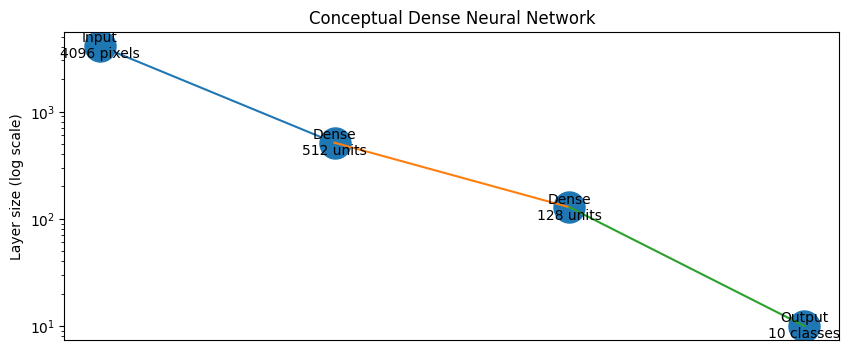

In [13]:
layer_names = [
    "Input\n4096 pixels",
    "Dense\n512 units",
    "Dense\n128 units",
    "Output\n10 classes",
]

x_positions = np.arange(len(layer_names))
layer_sizes = [4096, 512, 128, 10]

plt.figure(figsize=(10, 4))
plt.scatter(x_positions, layer_sizes, s=500)

for x, name, size in zip(x_positions, layer_names, layer_sizes):
    plt.text(x, size, name, ha="center", va="center")

for i in range(len(x_positions) - 1):
    plt.plot([x_positions[i], x_positions[i + 1]], [layer_sizes[i], layer_sizes[i + 1]])

plt.yscale("log")
plt.xticks([])
plt.ylabel("Layer size (log scale)")
plt.title("Conceptual Dense Neural Network")
plt.show()


The dense neural network is more expressive than a linear model because it has nonlinear hidden layers.

But it still receives the image as one long vector.

So compared to CNNs, it does not have a built-in assumption that nearby pixels matter together.

This is why dense networks are not usually the first choice for raw image inputs.


## 7.3 Convolutional Neural Network

A Convolutional Neural Network, or CNN, keeps the image as a 2D structure.

Instead of flattening the image immediately, it applies small filters over local regions.

For example, a `3 × 3` filter looks at only a small neighborhood at a time.

This is powerful because visual patterns are often local:

- edges
- corners
- textures
- small shapes

The output of a filter is called a **feature map**.


In [14]:
cnn_input = image_64

print("CNN input shape:", cnn_input.shape)
print("This keeps height and width instead of flattening immediately.")

CNN input shape: (64, 64)
This keeps height and width instead of flattening immediately.


Let's apply a simple manually designed edge-like filter.

This is not training a CNN.

It is just showing the kind of local operation a convolution layer performs.


In [15]:
from scipy.ndimage import convolve

edge_kernel = np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]])

feature_map = convolve(image_64.astype(np.float32), edge_kernel)
feature_map = np.clip(feature_map, 0, 255)

print("Input image shape:", image_64.shape)
print("Kernel shape:", edge_kernel.shape)
print("Feature map shape:", feature_map.shape)


Input image shape: (64, 64)
Kernel shape: (3, 3)
Feature map shape: (64, 64)


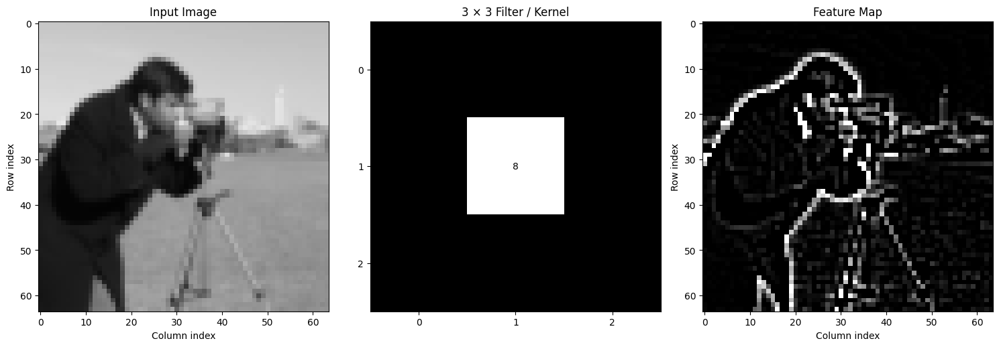

In [16]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(image_64, cmap="gray", vmin=0, vmax=255)
axes[0].set_title("Input Image")
axes[0].set_xlabel("Column index")
axes[0].set_ylabel("Row index")

axes[1].imshow(edge_kernel, cmap="gray")
axes[1].set_title("3 × 3 Filter / Kernel")
axes[1].set_xticks(range(3))
axes[1].set_yticks(range(3))

for row in range(edge_kernel.shape[0]):
    for col in range(edge_kernel.shape[1]):
        axes[1].text(col, row, str(edge_kernel[row, col]), ha="center", va="center")

axes[2].imshow(feature_map, cmap="gray")
axes[2].set_title("Feature Map")
axes[2].set_xlabel("Column index")
axes[2].set_ylabel("Row index")

plt.tight_layout()
plt.show()


A CNN learns many filters like this.

Different filters can learn to detect different patterns.

For example:

- one filter may respond to vertical edges
- another may respond to horizontal edges
- another may respond to texture
- deeper filters may respond to object parts

The important difference is this:

```python
Linear / Dense model: flatten first
CNN: preserve spatial structure first
```


## 7.4 Vision Transformer

A Vision Transformer, or ViT, looks at images differently.

Instead of sliding filters over the image like a CNN, it splits the image into patches.

Each patch becomes like a token.

This is similar to how a language transformer processes text tokens.

For example, if we split a `64 × 64` image into `16 × 16` patches, we get:

```python
4 patches across height × 4 patches across width = 16 patches
```

Each patch can then be converted into a vector and passed into a transformer.


In [17]:
patch_size = 16

height, width = image_64.shape

num_patches_y = height // patch_size
num_patches_x = width // patch_size
total_patches = num_patches_y * num_patches_x

print("Image shape:", image_64.shape)
print("Patch size:", patch_size, "×", patch_size)
print("Patches along height:", num_patches_y)
print("Patches along width:", num_patches_x)
print("Total patches:", total_patches)


Image shape: (64, 64)
Patch size: 16 × 16
Patches along height: 4
Patches along width: 4
Total patches: 16


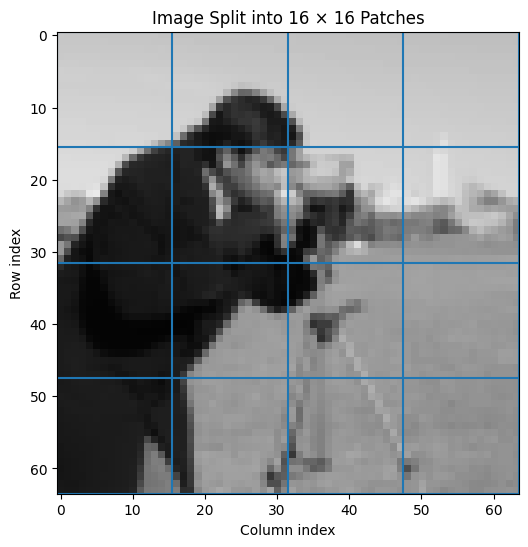

In [18]:
plt.figure(figsize=(6, 6))
plt.imshow(image_64, cmap="gray", vmin=0, vmax=255)

# Draw patch grid
for y in range(0, height + 1, patch_size):
    plt.axhline(y - 0.5)

for x in range(0, width + 1, patch_size):
    plt.axvline(x - 0.5)

plt.title("Image Split into 16 × 16 Patches")
plt.xlabel("Column index")
plt.ylabel("Row index")
plt.show()


Now let's extract the patches as separate image regions.

Each patch is still a small image tensor.

Later, a Vision Transformer would flatten each patch and project it into an embedding vector.


In [19]:
patches = []

for row_start in range(0, height, patch_size):
    for col_start in range(0, width, patch_size):
        patch = image_64[
            row_start : row_start + patch_size, col_start : col_start + patch_size
        ]
        patches.append(patch)

patches = np.array(patches)

print("Patches shape:", patches.shape)
print("Meaning: (number_of_patches, patch_height, patch_width)")


Patches shape: (16, 16, 16)
Meaning: (number_of_patches, patch_height, patch_width)


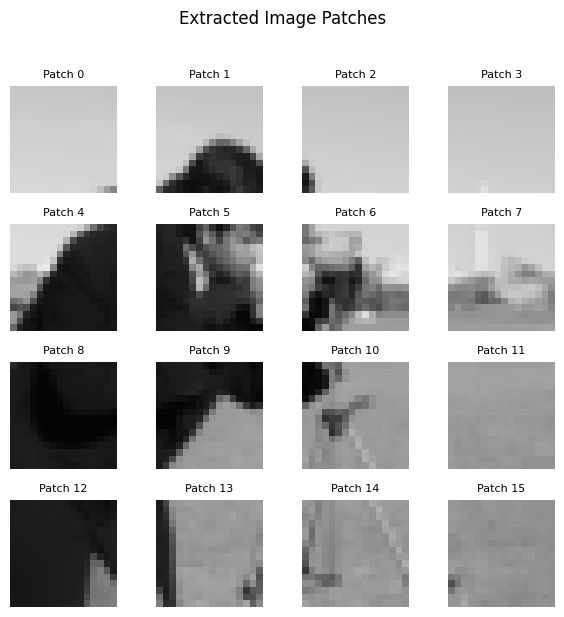

In [20]:
fig, axes = plt.subplots(num_patches_y, num_patches_x, figsize=(6, 6))

patch_index = 0

for row in range(num_patches_y):
    for col in range(num_patches_x):
        axes[row, col].imshow(patches[patch_index], cmap="gray", vmin=0, vmax=255)
        axes[row, col].set_title(f"Patch {patch_index}", fontsize=8)
        axes[row, col].axis("off")
        patch_index += 1

plt.suptitle("Extracted Image Patches", y=1.02)
plt.tight_layout()
plt.show()


In [21]:
flattened_patches = patches.reshape(total_patches, -1)

print("Original patches shape:", patches.shape)
print("Flattened patches shape:", flattened_patches.shape)
print("Meaning: (number_of_patches, values_per_patch)")

Original patches shape: (16, 16, 16)
Flattened patches shape: (16, 256)
Meaning: (number_of_patches, values_per_patch)


For this example:

```python
16 patches × 256 values per patch
```

Each `16 × 16` patch becomes a vector of length `256`.

A Vision Transformer then maps each patch vector into an embedding.

Conceptually:

```python
image → patches → patch vectors → patch embeddings → transformer
```

The transformer can then compare all patches with each other using attention.


## 7.5 Comparing the Four Approaches

Let's summarize how each model type receives the image.

The same image can be represented differently depending on the model.


In [22]:
comparison = [
    ["Linear Model", "Flatten image", "(4096,)", "Simple, but loses 2D structure"],
    [
        "Dense Neural Network",
        "Flatten image, then hidden layers",
        "(4096,)",
        "More expressive, but still loses spatial structure",
    ],
    [
        "CNN",
        "Keep image grid and apply filters",
        "(64, 64)",
        "Uses local spatial structure",
    ],
    [
        "Vision Transformer",
        "Split image into patches",
        "(16, 256)",
        "Treats patches like tokens",
    ],
]

for row in comparison:
    print(f"{row[0]}")
    print(f"  Input idea: {row[1]}")
    print(f"  Example shape: {row[2]}")
    print(f"  Key point: {row[3]}")
    print()


Linear Model
  Input idea: Flatten image
  Example shape: (4096,)
  Key point: Simple, but loses 2D structure

Dense Neural Network
  Input idea: Flatten image, then hidden layers
  Example shape: (4096,)
  Key point: More expressive, but still loses spatial structure

CNN
  Input idea: Keep image grid and apply filters
  Example shape: (64, 64)
  Key point: Uses local spatial structure

Vision Transformer
  Input idea: Split image into patches
  Example shape: (16, 256)
  Key point: Treats patches like tokens



| Model Type | What happens to the image? | Example Shape | Main Idea |
|---|---|---:|---|
| Linear model | Flatten into one vector | `(4096,)` | Treat every pixel as a feature |
| Dense neural network | Flatten, then pass through hidden layers | `(4096,)` | More expressive than linear, but still flat |
| CNN | Keep 2D structure and apply filters | `(64, 64)` | Learn local visual patterns |
| Vision Transformer | Split image into patches | `(16, 256)` | Treat image patches like tokens |

The big picture:

```python
Linear model:        image → flat vector → output
Dense network:       image → flat vector → hidden layers → output
CNN:                 image → filters → feature maps → output
Vision Transformer:  image → patches → tokens → attention → output
```

Different model families make different assumptions about images.

A good computer vision engineer understands these assumptions instead of treating models as black boxes.


# 8. Mini Challenges

Now it is your turn.

The goal of these challenges is to help you connect everything we covered:

```python
image → numbers → tensors → operations → features → models
```

You do not need to understand every detail perfectly yet.

Focus on experimenting, observing, and explaining what you see.


## Challenge Setup

You can use either:

1. A built-in public image from `scikit-image`
2. Your own image uploaded into the notebook environment

For now, we will start with a public image so everyone can run the notebook without uploading anything.


In [23]:
import numpy as np
import matplotlib.pyplot as plt

from skimage import data
from skimage.color import rgb2gray
from skimage.transform import resize
from skimage.filters import gaussian, sobel
from skimage.util import img_as_ubyte

from scipy.ndimage import convolve


Image type: <class 'numpy.ndarray'>
Image shape: (300, 451, 3)
Image dtype: uint8
Minimum pixel value: 0
Maximum pixel value: 231


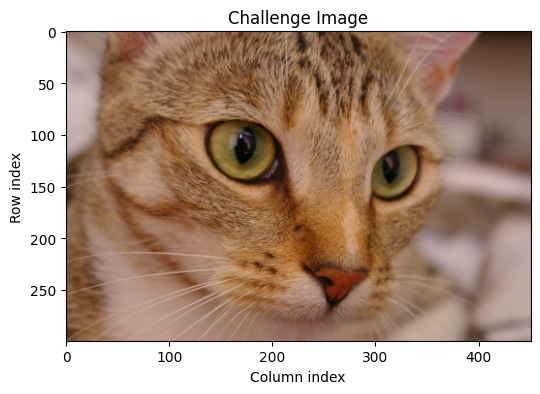

In [58]:
# Choose a public image from scikit-image
challenge_image = data.chelsea()

print("Image type:", type(challenge_image))
print("Image shape:", challenge_image.shape)
print("Image dtype:", challenge_image.dtype)
print("Minimum pixel value:", challenge_image.min())
print("Maximum pixel value:", challenge_image.max())

plt.figure(figsize=(6, 6))
plt.imshow(challenge_image)
plt.title("Challenge Image")
plt.xlabel("Column index")
plt.ylabel("Row index")
plt.show()


## Challenge 1: Inspect the Image Tensor

Answer these questions:

1. What is the height of the image?

  Ans: Height: 300

2. What is the width of the image?

 Ans: Width: 451

3. How many channels does it have?

 Ans: Channels: 3

4. What is the minimum pixel value?

 Ans: Minimum pixel value: 0

5. What is the maximum pixel value?

 Ans: Maximum pixel value: 231


Remember:

```python
image.shape
```

usually gives:

```python
(height, width, channels)
```

for RGB images.

In [59]:
# Your code here
height = challenge_image.shape[0]
width = challenge_image.shape[1]
channels = challenge_image.shape[2]

print("Height:", height)
print("Width:", width)
print("Channels:", channels)
print("Minimum pixel value:", challenge_image.min())
print("Maximum pixel value:", challenge_image.max())

Height: 300
Width: 451
Channels: 3
Minimum pixel value: 0
Maximum pixel value: 231


## Challenge 2: Inspect One Pixel

Pick one pixel location and inspect its RGB values.

A pixel in an RGB image looks like this:

```python
[R, G, B]
```

Try changing the `row` and `col` values.

Observe how the RGB values change depending on where the pixel is located.

In [60]:
# Try changing these values
row_1 = 100
col_1 = 150

pixel = challenge_image[row_1, col_1]

print(f"Pixel location: row={row_1}, col={col_1}")
print("RGB pixel value:", pixel)
print("Red:", pixel[0])
print("Green:", pixel[1])
print("Blue:", pixel[2])

# Try changing these values
row_2 = 100+100
col_2 = 150+100

pixel = challenge_image[row_2, col_2]

print(f"Pixel location: row={row_2}, col={col_2}")
print("RGB pixel value:", pixel)
print("Red:", pixel[0])
print("Green:", pixel[1])
print("Blue:", pixel[2])

Pixel location: row=100, col=150
RGB pixel value: [149 118  63]
Red: 149
Green: 118
Blue: 63
Pixel location: row=200, col=250
RGB pixel value: [155  86  27]
Red: 155
Green: 86
Blue: 27


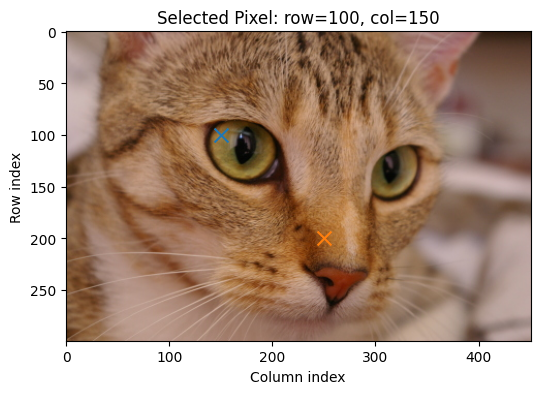

In [61]:
plt.figure(figsize=(6, 6))
plt.imshow(challenge_image)
plt.scatter(col_1, row_1, s=100, marker="x")
plt.scatter(col_2, row_2, s=100, marker="x")
plt.title(f"Selected Pixel: row={row_1}, col={col_1}")
plt.xlabel("Column index")
plt.ylabel("Row index")
plt.show()

## Challenge 3: Crop a Region

Crop a smaller region from the image.

Cropping uses NumPy slicing:

```python
image[start_row:end_row, start_col:end_col]
```

Try selecting different regions.

For example:

- face
- helmet
- background
- clothing
- any small object/detail you notice


Original image shape: (300, 451, 3)
Cropped region shape: (50, 55, 3)


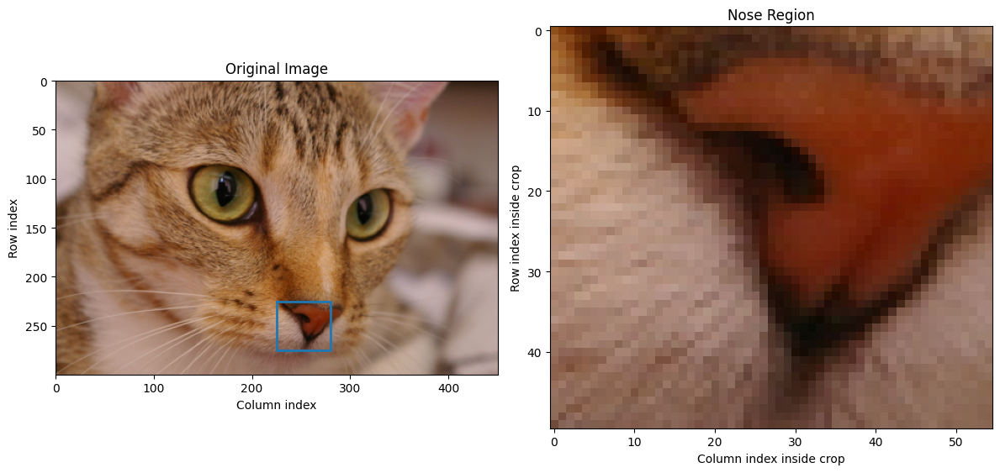

In [65]:
# Try changing these values
start_row = 225
end_row = 275

start_col = 225
end_col = 280

# Your code here
# Uncomment the line below and complete it

cropped_region = challenge_image[start_row:end_row, start_col:end_col]


print("Original image shape:", challenge_image.shape)
print("Cropped region shape:", cropped_region.shape)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(challenge_image)
axes[0].set_title("Original Image")
axes[0].set_xlabel("Column index")
axes[0].set_ylabel("Row index")

# Draw crop boundary
rect_x = [start_col, end_col, end_col, start_col, start_col]
rect_y = [start_row, start_row, end_row, end_row, start_row]
axes[0].plot(rect_x, rect_y, linewidth=2)

axes[1].imshow(cropped_region)
axes[1].set_title("Nose Region")
axes[1].set_xlabel("Column index inside crop")
axes[1].set_ylabel("Row index inside crop")

plt.tight_layout()
plt.show()


## Challenge 4: Separate RGB Channels

Split the image into its Red, Green, and Blue channels.

Then display all three channels side by side.

Question:

Which channel seems most active in different parts of the image?

Ans: In the nose part, the RED color is more prominent that GREEN and BLUE.

array([[143, 143, 141, ...,  45,  45,  45],
       [146, 145, 143, ...,  46,  45,  47],
       [148, 147, 146, ...,  48,  49,  50],
       ...,
       [ 92, 105, 132, ..., 172, 172, 172],
       [128, 139, 134, ..., 166, 166, 167],
       [139, 127, 125, ..., 161, 161, 162]], dtype=uint8)
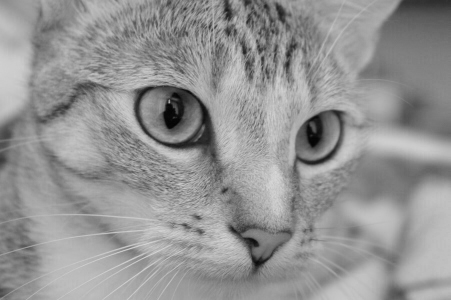

In [69]:
challenge_image[:,:,0]

array([[143, 143, 141, ...,  45,  45,  45],
       [146, 145, 143, ...,  46,  45,  47],
       [148, 147, 146, ...,  48,  49,  50],
       ...,
       [ 92, 105, 132, ..., 172, 172, 172],
       [128, 139, 134, ..., 166, 166, 167],
       [139, 127, 125, ..., 161, 161, 162]], dtype=uint8)
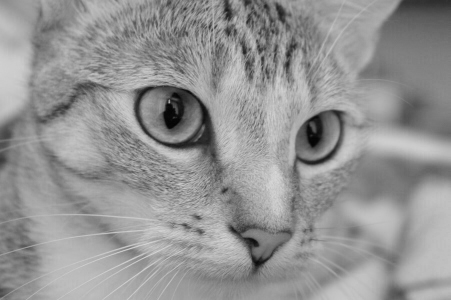

In [72]:
challenge_image[...,0]

array([[143, 143, 141, ...,  45,  45,  45],
       [146, 145, 143, ...,  46,  45,  47],
       [148, 147, 146, ...,  48,  49,  50],
       ...,
       [ 92, 105, 132, ..., 172, 172, 172],
       [128, 139, 134, ..., 166, 166, 167],
       [139, 127, 125, ..., 161, 161, 162]], dtype=uint8)
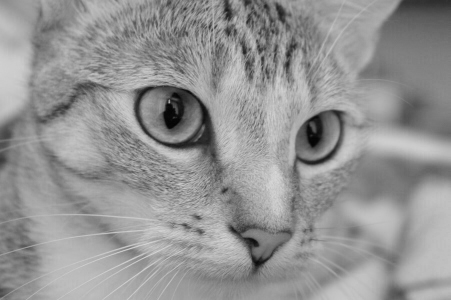

In [73]:
np.take(challenge_image, 0, axis=2)

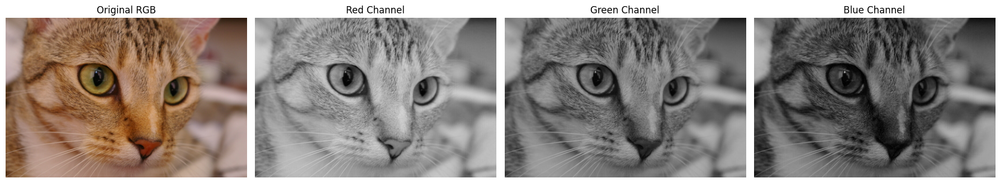

In [76]:
red_channel = challenge_image[:,:,0]
green_channel = challenge_image[:,:,1]
blue_channel = challenge_image[:,:,2]

fig, axes = plt.subplots(1, 4, figsize=(18, 5))

axes[0].imshow(challenge_image)
axes[0].set_title("Original RGB")
axes[0].axis("off")

axes[1].imshow(red_channel, cmap="gray", vmin=0, vmax=255)
axes[1].set_title("Red Channel")
axes[1].axis("off")

axes[2].imshow(green_channel, cmap="gray", vmin=0, vmax=255)
axes[2].set_title("Green Channel")
axes[2].axis("off")

axes[3].imshow(blue_channel, cmap="gray", vmin=0, vmax=255)
axes[3].set_title("Blue Channel")
axes[3].axis("off")

plt.tight_layout()
plt.show()


## Challenge 5: Convert to Grayscale

Convert the RGB image into grayscale.

Then compare the shapes.

Question:

What happened to the channel dimension?

Ans: The grayscale have single channel dimentsion so we have only L x W.

Original RGB shape: (300, 451, 3)
Grayscale shape: (300, 451)
Grayscale dtype: uint8
Minimum grayscale value: 4
Maximum grayscale value: 193


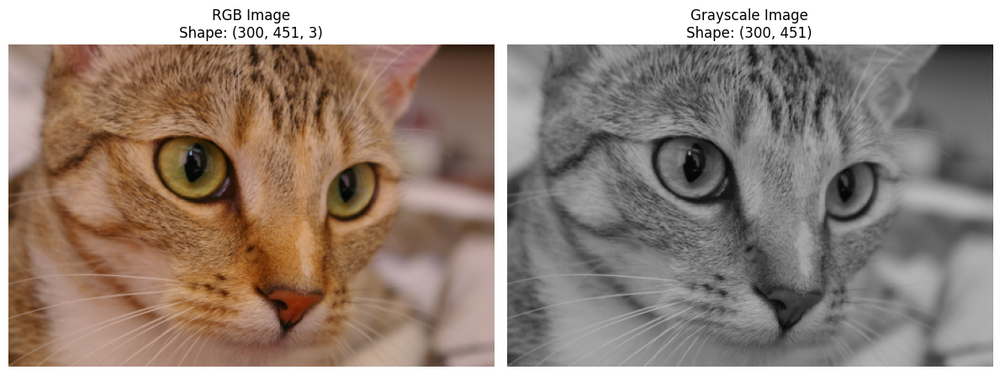

In [79]:
from skimage.color import rgb2gray
from skimage.util import img_as_ubyte

grayscale_image = rgb2gray(challenge_image)# Convert to grayscale
grayscale_image = img_as_ubyte(grayscale_image)# Convert to 8-bit unsigned integer format

print("Original RGB shape:", challenge_image.shape)
print("Grayscale shape:", grayscale_image.shape)
print("Grayscale dtype:", grayscale_image.dtype)
print("Minimum grayscale value:", grayscale_image.min())
print("Maximum grayscale value:", grayscale_image.max())

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(challenge_image)
axes[0].set_title(f"RGB Image\nShape: {challenge_image.shape}")
axes[0].axis("off")

axes[1].imshow(grayscale_image, cmap="gray", vmin=0, vmax=255)
axes[1].set_title(f"Grayscale Image\nShape: {grayscale_image.shape}")
axes[1].axis("off")

plt.tight_layout()
plt.show()


## Challenge 6: Resize the Image

Resize the image to a smaller fixed size.

Many computer vision models expect images to have a fixed input size.

For example:

```python
224 × 224 × 3
```

or smaller sizes like:

```python
64 × 64 × 3
```

Your task:

1. Choose a new height and width.
2. Resize `challenge_image`.
3. Print the original and resized shapes.
4. Display both images side by side.

Hint:

Use:

```python
resize(...)
```

Remember to use:

```python
preserve_range=True
anti_aliasing=True
```

and convert the result back to:

```python
np.uint8
```


In [80]:
challenge_image.shape

(300, 451, 3)

In [96]:
new_height = 400
new_width = 651
resized_challenge_image = resize(challenge_image, output_shape=(new_height, new_width), anti_aliasing=True, preserve_range=True)
resized_challenge_image = resized_challenge_image.astype(np.uint8)

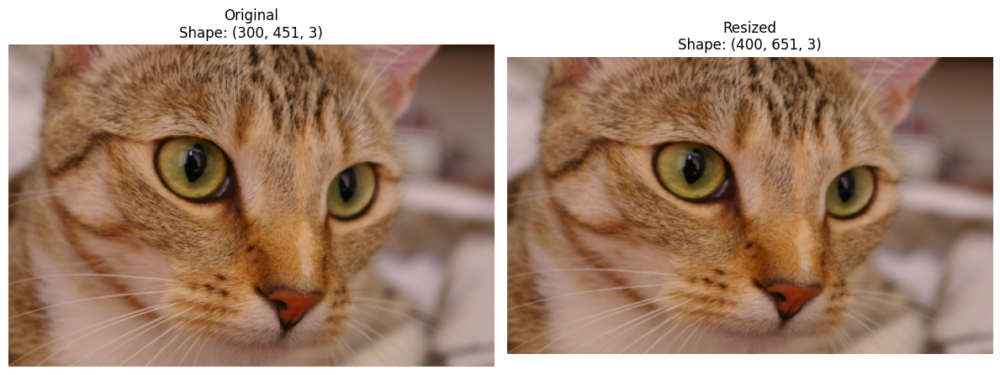

In [97]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(challenge_image)
axes[0].set_title(f"Original\nShape: {challenge_image.shape}")
axes[0].axis("off")

axes[1].imshow(resized_challenge_image)
axes[1].set_title(f"Resized\nShape: {resized_challenge_image.shape}")
axes[1].axis("off")

plt.tight_layout()
plt.show()


## Challenge 7: Flatten the Image

Flatten your resized image into a 1D vector.

Your task:

1. Use the resized image from Challenge 6.
2. Flatten it.
3. Print the original resized shape.
4. Print the flattened shape.
5. Verify the number of values manually.

Hint:

For an RGB image:

```python
height × width × channels
```

After flattening, all values are placed into one long vector.


In [103]:
flattened_image = resized_challenge_image.flatten()
print(resized_challenge_image.shape, flattened_image.shape) # 400 * 651 * 3 = 781,200

(400, 651, 3) (781200,)


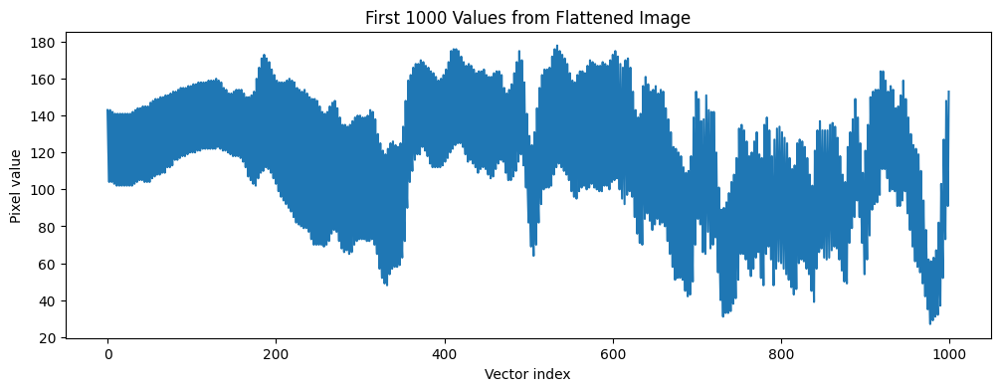

In [102]:
# Visualize the first 1000 values from your flattened image

plt.figure(figsize=(12, 4))
plt.plot(flattened_image[:1000])
plt.title("First 1000 Values from Flattened Image")
plt.xlabel("Vector index")
plt.ylabel("Pixel value")
plt.show()


## Challenge 8: Apply Blur

Apply Gaussian blur to `grayscale_image`.

Your task:

1. Choose a `sigma` value.
2. Apply Gaussian blur.
3. Display the original grayscale image and blurred image side by side.
4. Try multiple sigma values and observe the difference.

Questions:

1. What happens when `sigma` is small?

  Ans: Blurr intensity is small when `sigma` is small.

2. What happens when `sigma` is large?

 Ans: Blurr intensity is huge when `sigma` is large.

3. Which visual details disappear first?

 Ans: Eyes are one of the first to disappear.

**Hint:**

Use:

```python
gaussian(...)
```


In [118]:
blurred_image_1 = gaussian(grayscale_image, sigma=1, preserve_range=True).astype(np.uint8)
blurred_image_2 = gaussian(grayscale_image, sigma=2, preserve_range=True).astype(np.uint8)
blurred_image_3 = gaussian(grayscale_image, sigma=3, preserve_range=True).astype(np.uint8)
blurred_image_4 = gaussian(grayscale_image, sigma=4, preserve_range=True).astype(np.uint8)

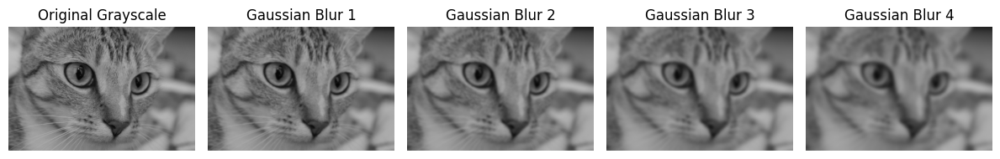

In [120]:
# Display your result

fig, axes = plt.subplots(1, 5, figsize=(12, 6))

axes[0].imshow(grayscale_image, cmap="gray", vmin=0, vmax=255)
axes[0].set_title("Original Grayscale")
axes[0].axis("off")

axes[1].imshow(blurred_image_1, cmap="gray", vmin=0, vmax=255)
axes[1].set_title(f"Gaussian Blur 1")
axes[1].axis("off")

axes[2].imshow(blurred_image_2, cmap="gray", vmin=0, vmax=255)
axes[2].set_title(f"Gaussian Blur 2")
axes[2].axis("off")

axes[3].imshow(blurred_image_3, cmap="gray", vmin=0, vmax=255)
axes[3].set_title(f"Gaussian Blur 3")
axes[3].axis("off")

axes[4].imshow(blurred_image_4, cmap="gray", vmin=0, vmax=255)
axes[4].set_title(f"Gaussian Blur 4")
axes[4].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
blurred_image_1 = gaussian(grayscale_image, sigma=0.1, preserve_range=True).astype(np.uint8)
blurred_image_2 = gaussian(grayscale_image, sigma=0.2, preserve_range=True).astype(np.uint8)
blurred_image_3 = gaussian(grayscale_image, sigma=0.3, preserve_range=True).astype(np.uint8)
blurred_image_4 = gaussian(grayscale_image, sigma=0.4, preserve_range=True).astype(np.uint8)

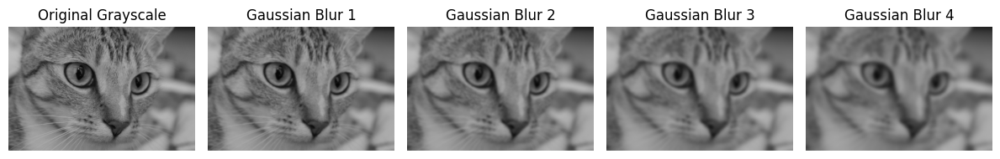

In [121]:
# Display your result

fig, axes = plt.subplots(1, 5, figsize=(12, 6))

axes[0].imshow(grayscale_image, cmap="gray", vmin=0, vmax=255)
axes[0].set_title("Original Grayscale")
axes[0].axis("off")

axes[1].imshow(blurred_image_1, cmap="gray", vmin=0, vmax=255)
axes[1].set_title(f"Gaussian Blur 1")
axes[1].axis("off")

axes[2].imshow(blurred_image_2, cmap="gray", vmin=0, vmax=255)
axes[2].set_title(f"Gaussian Blur 2")
axes[2].axis("off")

axes[3].imshow(blurred_image_3, cmap="gray", vmin=0, vmax=255)
axes[3].set_title(f"Gaussian Blur 3")
axes[3].axis("off")

axes[4].imshow(blurred_image_4, cmap="gray", vmin=0, vmax=255)
axes[4].set_title(f"Gaussian Blur 4")
axes[4].axis("off")

plt.tight_layout()
plt.show()


## Challenge 9: Apply Sharpening

Apply a sharpening kernel to `grayscale_image`.

A sharpening kernel increases local differences between neighboring pixels.

Your task:

1. Create a sharpening kernel.
2. Apply it using `convolve`.
3. Clip the output values between `0` and `255`.
4. Convert the result to `np.uint8`.
5. Display the original image, kernel, and sharpened image.

Hint:

A common sharpening kernel is:

```python
[
    [ 0, -1,  0],
    [-1,  5, -1],
    [ 0, -1,  0]
]
```

Question:

Which parts of the image become more noticeable after sharpening?
Ans: The subject in the cat eye is now more visible and crisp.

In [130]:
sharpen_kernel = np.array([
    [ 0, -1,  0],
    [-1,  5, -1],
    [ 0, -1,  0]
])
sharpened_image = convolve(grayscale_image.astype(np.float32), sharpen_kernel)
sharpened_image = np.clip(sharpened_image, 0, 255).astype(np.uint8)


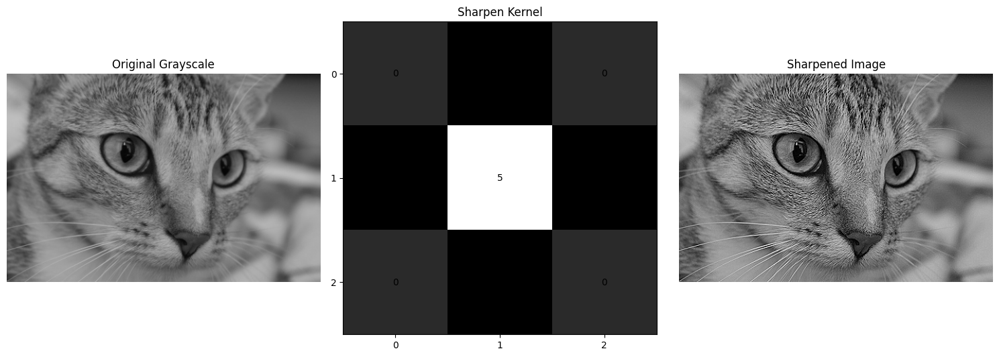

In [131]:
# Display your result

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(grayscale_image, cmap="gray", vmin=0, vmax=255)
axes[0].set_title("Original Grayscale")
axes[0].axis("off")

axes[1].imshow(sharpen_kernel, cmap="gray")
axes[1].set_title("Sharpen Kernel")
axes[1].set_xticks(range(3))
axes[1].set_yticks(range(3))

for row in range(sharpen_kernel.shape[0]):
    for col in range(sharpen_kernel.shape[1]):
        axes[1].text(col, row, str(sharpen_kernel[row, col]), ha="center", va="center")

axes[2].imshow(sharpened_image, cmap="gray", vmin=0, vmax=255)
axes[2].set_title("Sharpened Image")
axes[2].axis("off")

plt.tight_layout()
plt.show()


## Challenge 10: Apply Edge Detection

Apply edge detection to `grayscale_image`.

Edges are regions where pixel intensity changes sharply.

Your task:

1. Apply Sobel edge detection.
2. Print the shape and value range of the edge image.
3. Display the original grayscale image and edge image side by side.

Questions:

1. Which parts of the image are captured well by the edge detector?

 Ans: The edges of the eyes are nicely detected.

2. Which parts are ignored?

Ans: The background is ignored and we can't see backgroud edges.


3. Why do smooth regions become dark?

Ans: The place where it couldn't detect the edges have been darkened.


Hint:

Use:

```python
sobel(...)
```


Edges shape: (300, 451)
Minimum edge value: 0.0
Maximum edge value: 0.37061676412649697


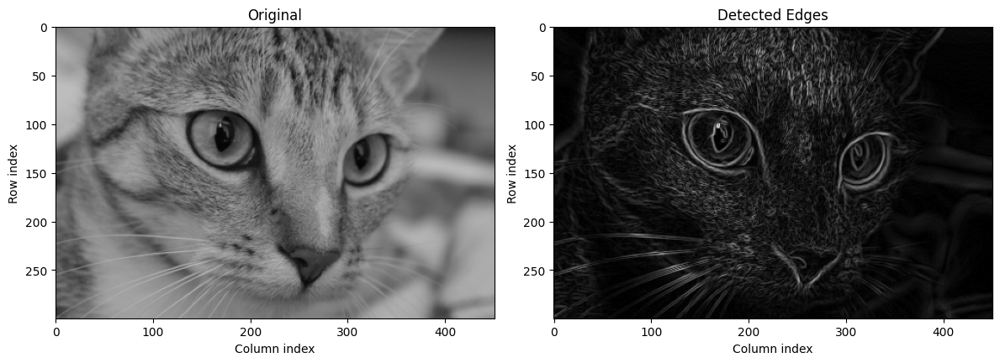

In [144]:
edge_image = sobel(grayscale_image)
print("Edges shape:", edge_image.shape)
print("Minimum edge value:", edge_image.min())
print("Maximum edge value:", edge_image.max())


fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(grayscale_image, cmap="gray", vmin=0, vmax=255)
axes[0].set_title("Original")
axes[0].set_xlabel("Column index")
axes[0].set_ylabel("Row index")

axes[1].imshow(edge_image, cmap="gray")
axes[1].set_title("Detected Edges")
axes[1].set_xlabel("Column index")
axes[1].set_ylabel("Row index")

plt.tight_layout()
plt.show()

## Challenge 11: Patchify the Image

Split a resized grayscale image into patches like a Vision Transformer.

Your task:

1. Resize `grayscale_image` to `64 × 64`.
2. Choose a patch size such as `8`, `16`, or `32`.
3. Compute how many patches fit along height and width.
4. Draw grid lines over the image to show the patches.
5. Try different patch sizes and compare.

Questions:

1. How many patches do you get?

Ans: 4 Patches for 32 patch size.

2. What happens when the patch size is smaller?

Ans: The number of patches increase as the patch size is reduced.


3. What happens when the patch size is larger?

Ans: The number of patches decrease as the patch size is increased.

Hint:

For a `64 × 64` image with `16 × 16` patches:

```python
4 patches along height × 4 patches along width = 16 patches
```


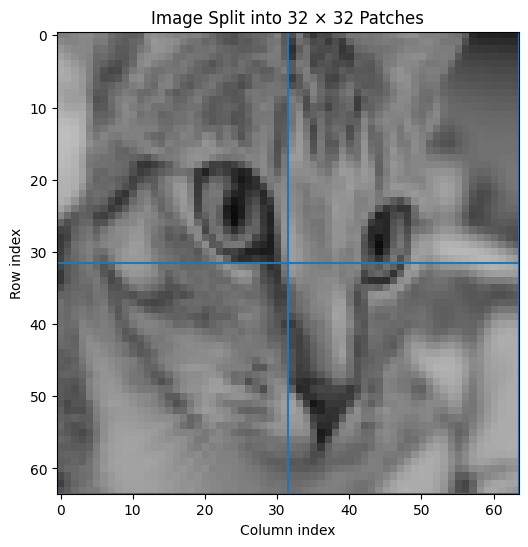

In [155]:
vit_image = resize(grayscale_image, (64, 64), preserve_range=True).astype(np.uint8)
patch_size = 32
height = vit_image.shape[0]
width = vit_image.shape[1]
num_patches_y = height // patch_size
num_patches_x = width // patch_size
total_patches = num_patches_y + num_patches_x

# Display your patch grid

plt.figure(figsize=(6, 6))
plt.imshow(vit_image, cmap="gray", vmin=0, vmax=255)

for y in range(0, height + 1, patch_size):
    plt.axhline(y - 0.5)

for x in range(0, width + 1, patch_size):
    plt.axvline(x - 0.5)

plt.title(f"Image Split into {patch_size} × {patch_size} Patches")
plt.xlabel("Column index")
plt.ylabel("Row index")
plt.show()


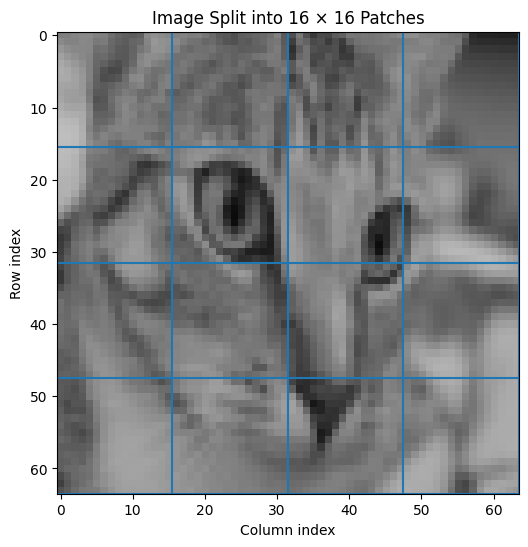

In [156]:
vit_image = resize(grayscale_image, (64, 64), preserve_range=True).astype(np.uint8)
patch_size = 16
height = vit_image.shape[0]
width = vit_image.shape[1]
num_patches_y = height // patch_size
num_patches_x = width // patch_size
total_patches = num_patches_y + num_patches_x

# Display your patch grid

plt.figure(figsize=(6, 6))
plt.imshow(vit_image, cmap="gray", vmin=0, vmax=255)

for y in range(0, height + 1, patch_size):
    plt.axhline(y - 0.5)

for x in range(0, width + 1, patch_size):
    plt.axvline(x - 0.5)

plt.title(f"Image Split into {patch_size} × {patch_size} Patches")
plt.xlabel("Column index")
plt.ylabel("Row index")
plt.show()


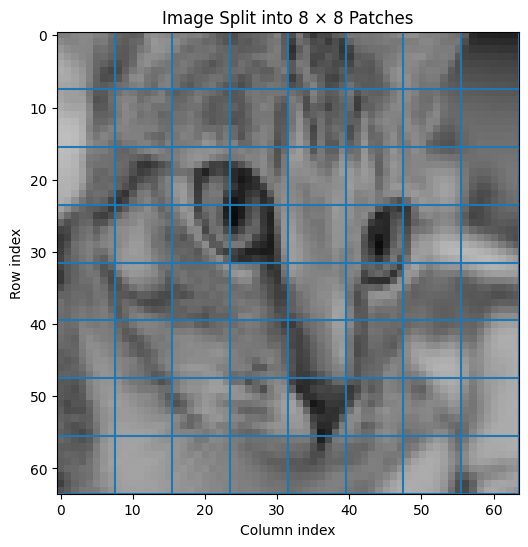

In [157]:
vit_image = resize(grayscale_image, (64, 64), preserve_range=True).astype(np.uint8)
patch_size = 8
height = vit_image.shape[0]
width = vit_image.shape[1]
num_patches_y = height // patch_size
num_patches_x = width // patch_size
total_patches = num_patches_y + num_patches_x

# Display your patch grid

plt.figure(figsize=(6, 6))
plt.imshow(vit_image, cmap="gray", vmin=0, vmax=255)

for y in range(0, height + 1, patch_size):
    plt.axhline(y - 0.5)

for x in range(0, width + 1, patch_size):
    plt.axvline(x - 0.5)

plt.title(f"Image Split into {patch_size} × {patch_size} Patches")
plt.xlabel("Column index")
plt.ylabel("Row index")
plt.show()


# 9. Wrap-up

In this notebook, we moved from human intuition to machine representation.

Humans see images as scenes, objects, faces, places, and meaning.

Computers receive images as numbers.

That is the first major shift in computer vision.


## The Big Pipeline

A useful way to summarize everything is:

```python
image → numbers → tensors → operations → features → models
```

Let's unpack that one final time.


## 1. Image → Numbers

A digital image is made of pixels.

Each pixel stores numerical intensity values.

For grayscale images:

```python
pixel = brightness
```

For RGB images:

```python
pixel = [red, green, blue]
```

So an image is not stored as meaning.

It is stored as numerical values.


## 2. Numbers → Tensors

When pixel values are arranged into structured dimensions, we get tensors.

A grayscale image may have shape:

```python
(height, width)
```

An RGB image usually has shape:

```python
(height, width, channels)
```

A batch of RGB images may have shape:

```python
(batch_size, height, width, channels)
```

This is the form most deep learning systems work with.


## 3. Tensors → Operations

Once an image is represented as a tensor, we can apply operations to it.

For example:

- crop a region
- resize the image
- split color channels
- convert to grayscale
- flatten into a vector
- apply blur
- sharpen details
- detect edges
- split into patches

These operations change the tensor.

Sometimes they change the shape.

Sometimes they change the values.

Sometimes they change both.


## 4. Operations → Features

Some operations help reveal useful structure.

For example:

- blur reduces small noisy details
- sharpening emphasizes local detail
- edge detection highlights boundaries
- CNN filters produce feature maps
- ViT patching turns image regions into tokens

A **feature** is a useful signal extracted from raw data.

In traditional computer vision, humans designed many feature extraction methods manually.

In deep learning, models learn many useful features directly from data.


## 5. Features → Models

Different model families consume image data differently.

A linear model usually receives:

```python
flattened pixels
```

A dense neural network usually receives:

```python
flattened pixels → hidden layers
```

A CNN receives:

```python
image grid → filters → feature maps
```

A Vision Transformer receives:

```python
image → patches → patch embeddings → attention
```

The input image may be the same, but the model assumptions are different.


## Final Takeaway

Computer vision starts with a simple but powerful idea:

```python
images are numerical tensors
```

Once we understand that, the rest of computer vision becomes easier to reason about.

Models are not seeing the world the way humans do.

They are learning patterns from numbers.

Our job is to understand how those numbers are represented, transformed, and learned from.
